In [1]:
from glob import glob
import sys
import getpass
import os
# import psutil
from os.path import join, exists
from os.path import getsize
import pickle
import numpy as np
import pandas as pd
import scipy

from tqdm import tqdm

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
%matplotlib inline
import seaborn as sns
import statsmodels.stats.multitest
# from statsmodels.sandbox.stats.multicomp import multipletests

# import nilearn.masking
from nilearn import plotting as nplt
from nilearn import image as niimg
from nilearn.input_data import NiftiLabelsMasker
# from nilearn.regions import connected_label_regions
from nilearn.connectome import ConnectivityMeasure
import nilearn.decoding

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import cross_validate
from sklearn.model_selection import GroupKFold
from sklearn.preprocessing import StandardScaler
# from sklearn.svm import LinearSVC

/home/sungbeenpark/anaconda3/envs/GA/lib/python3.9/site-packages/nilearn/datasets/__init__.py:86: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  warn("Fetchers from the nilearn.datasets module will be "


In [2]:
## experimental properties
list_subj = ['01', '02', '05', '07', '08', '11', '12', '13', '14', '15'
             ,'18', '19', '20', '21', '23', '26', '27', '28', '29', '30'
             ,'31', '32', '33', '34', '35', '36', '37', '38', '42', '44']
list_stage = ['early_practice', 'early_unpractice', 'late_practice', 'late_unpractice']
list_run = ['r%02d'%(r+1) for r in range(6)]

In [3]:
dir_fmri = '/mnt/sda2/GA/fmri_data/'

---

로컬 메모리 상의 기준보다 크기가 큰 변수와 그 크기를 보여줌

In [ ]:
import sys

def sizeof_fmt(num, suffix='B'):
    ''' by Fred Cirera,  https://stackoverflow.com/a/1094933/1870254, modified'''
    for unit in ['','Ki','Mi','Gi','Ti','Pi','Ei','Zi']:
        if abs(num) < 1024.0:
            return "%3.1f %s%s" % (num, unit, suffix)
        num /= 1024.0
    return "%.1f %s%s" % (num, 'Yi', suffix)

In [4]:
for name, size in sorted(((name, sys.getsizeof(value)) for name, value in locals().items()), key= lambda x: -x[1])[:10]:
    print("{:>30}: {:>8}".format(name, sizeof_fmt(size)))

                          tqdm:  1.0 KiB
             NiftiLabelsMasker:  1.0 KiB
           ConnectivityMeasure:  1.0 KiB
    LinearDiscriminantAnalysis:  1.0 KiB
                    GroupKFold:  1.0 KiB
                StandardScaler:  1.0 KiB
                          _iii:  1.0 KiB
                           _i1:  1.0 KiB
                           _i4:  563.0 B
                           _ii:  427.0 B


---

## 0. ROIs

In [4]:
# roi_imgs = {}
roi_paths = {}
roi_regions = {}

load fan masks

In [5]:
fan_info = pd.read_csv(join('/mnt/sda2/Fan280/fan_cluster_net_20200121.csv'), sep=',', index_col=0)

In [6]:
# fan_imgs={}
# path_list = sorted(glob(join(dir_fmri, 'masks', 'fan280', '*.nii.gz')))
# for path in path_list:
#     temp = path.split('/')[-1].replace('.nii.gz', '')
#     fname = temp.split('.')[-1]
#     fan_imgs[fname] = niimg.load_img(path)

- motor system

In [7]:
module = 'somatomotor'

dt = pd.DataFrame()
for network7 in [2]:
    dt = dt.append(fan_info[(fan_info.yeo_7network == network7)])
    
rr = []
for idx in dt.index:
    label = dt.loc[idx,'label']
    
    region = dt.loc[idx,'region']
    rr.append(region)
    
#     roi_imgs[region] = fan_imgs['%03d'%int(label)]
    roi_paths[region] = join(dir_fmri, 'masks/fan280/fan.roi.GA.%03d.nii.gz'%int(label))
    
roi_regions[module] = sorted(rr)

- visual area

In [8]:
module = 'vision'

dt = pd.DataFrame()
for network7 in [1]:
    dt = dt.append(fan_info[(fan_info.yeo_7network == network7)])
    
rr = []
for idx in dt.index:
    label = dt.loc[idx,'label']
    
    region = dt.loc[idx,'region']
    rr.append(region)
    
#     roi_imgs[region] = fan_imgs['%03d'%int(label)]
    roi_paths[region] = join(dir_fmri, 'masks/fan280/fan.roi.GA.%03d.nii.gz'%int(label))
    
roi_regions[module] = sorted(rr)

- DMN

In [9]:
# for module in ['Core', 'MTLsub', 'dMsub']:
#     rr = []
#     tmp = glob(join(dir_fmri, 'masks', 'DMN', module+'_*.nii'))
#     for path in tmp:
#         region = path.split('/')[-1].replace('.nii', '')
#         rr.append(region)
# #         roi_imgs[region] = niimg.load_img(path)
#         roi_paths[region] = path
#     roi_regions[module] = sorted(rr)

In [10]:
module = 'DMN'

dt = pd.DataFrame()
for network7 in [7]:
    dt = dt.append(fan_info[(fan_info.yeo_7network == network7)])
    
rr = []
for idx in dt.index:
    label = dt.loc[idx,'label']
    
    region = dt.loc[idx,'region']
    rr.append(region)
    
#     roi_imgs[region] = fan_imgs['%03d'%int(label)]
    roi_paths[region] = join(dir_fmri, 'masks/fan280/fan.roi.GA.%03d.nii.gz'%int(label))
    
roi_regions[module] = sorted(rr)

---

check an overlap

In [10]:
atlas = niimg.load_img(roi_paths.values())
print(len(roi_paths.values()), atlas.shape)
img = niimg.math_img('np.sum(img, axis=-1, keepdims=True)', img=atlas)
overlap = niimg.math_img('img>1', img=img)

img = img.get_fdata()
cnt = np.sum(img[img>1])

tmp = np.unique(img)
print(tmp, cnt)
if tmp.shape[0] > 2:
    print('%d voxels are overlapped!'%cnt)
    nplt.plot_roi(overlap)

103 (72, 85, 72, 103)
[0. 1.] 0.0


In [11]:
roi_map_label = []
cnt = 0
for _, nodes in roi_regions.items():
    for node in nodes:
        roi_map_label.append(node)
        path = roi_paths[node]
        if cnt == 0:
            roi_map = niimg.load_img(path)
        else:
            tmp = niimg.load_img(path)
            roi_map = niimg.math_img(img1=roi_map, img2=tmp, formula='img1 + (%d+1)*img2'%cnt)
        cnt+=1
print(roi_map.shape)

(72, 85, 72)


[  0.   1.   2.   3.   4.   5.   6.   7.   8.   9.  10.  11.  12.  13.
  14.  15.  16.  17.  18.  19.  20.  21.  22.  23.  24.  25.  26.  27.
  28.  29.  30.  31.  32.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  42.  43.  44.  45.  46.  47.  48.  49.  50.  51.  52.  53.  54.  55.
  56.  57.  58.  59.  60.  61.  62.  63.  64.  65.  66.  67.  68.  69.
  70.  71.  72.  73.  74.  75.  76.  77.  78.  79.  80.  81.  82.  83.
  84.  85.  86.  87.  88.  89.  90.  91.  92.  93.  94.  95.  96.  97.
  98.  99. 100. 101. 102. 103.]


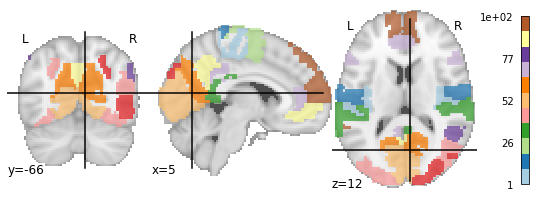

In [12]:
print(np.unique(roi_map.get_fdata()))
nplt.plot_roi(roi_map, colorbar=True, cmap='Paired')

---

## 1. Loading time-series mean activities

In [5]:
dir_root = join('/home/sungbeenpark/GA')
stat = 'pb04.errts_tproject'

In [6]:
with open(join(dir_root, 'tsmean/tsmean.%s.7network_1-2-7.pkl'%stat), 'rb') as f:
    tsmean = pickle.load(f)

In [7]:
list(tsmean.keys())[:10]

['map',
 'labels',
 'regions',
 ('GA01', 'r06'),
 ('GA01', 'r04'),
 ('GA01', 'r05'),
 ('GA01', 'r01'),
 ('GA01', 'r02'),
 ('GA01', 'r03'),
 ('GB01', 'r06')]

In [8]:
tsmean[('GA01','r01')].shape

(1096, 103)

In [9]:
tsmean_genuine = {}
for i, (k, v) in enumerate(tsmean.items()):
    if i > 2:
        tsmean_genuine[k] = v

In [10]:
from utils_Park import network as SamNet

In [11]:
preproc = SamNet.preprocessed(
    tsmean=tsmean_genuine
    , atlas=tsmean['map']
)

[  0.   1.   2.   3.   4.   5.   6.   7.   8.   9.  10.  11.  12.  13.
  14.  15.  16.  17.  18.  19.  20.  21.  22.  23.  24.  25.  26.  27.
  28.  29.  30.  31.  32.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  42.  43.  44.  45.  46.  47.  48.  49.  50.  51.  52.  53.  54.  55.
  56.  57.  58.  59.  60.  61.  62.  63.  64.  65.  66.  67.  68.  69.
  70.  71.  72.  73.  74.  75.  76.  77.  78.  79.  80.  81.  82.  83.
  84.  85.  86.  87.  88.  89.  90.  91.  92.  93.  94.  95.  96.  97.
  98.  99. 100. 101. 102. 103.]


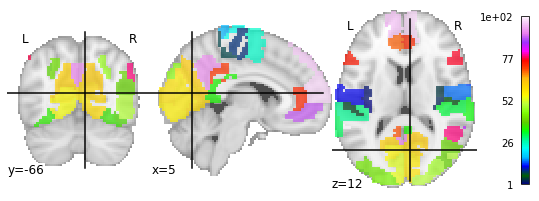

In [12]:
preproc.plot_atlas()

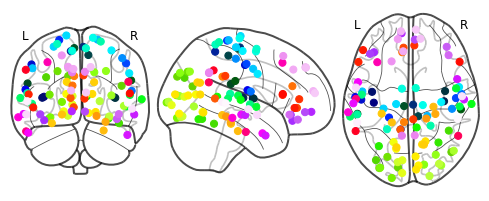

In [13]:
preproc.plot_connectom()

In [12]:
# def load_1d(fname):
#     with open(join(fname),'rb') as fr:
#         txt_1d = np.loadtxt(fr, delimiter='\n')

#     return txt_1d

In [8]:
# dir_3dmaskave = join(dir_root, stat, 'tsmean')

In [9]:
# rr = []
# for module in ['Core', 'MTLsub', 'dMsub']:
#     tmp = glob(join(dir_fmri, 'masks', 'DMN', module+'_*.nii'))
#     for path in tmp:
#         region = path.split('/')[-1].replace('.nii', '')
#         rr.append(region)

In [10]:
# ## tsmean.errts_tproject_bp.subj.run.region.1D 의 개수가 폴더당 360(=12*30)개가 아닌 355개임.
# ## -> errts_tproject_bp의 run 5개 누락있음.
# list_1D = []
# for region in rr:
#     list_1D.append(sorted(glob(join(dir_3dmaskave, region, '*.1D'))))
# list_1D = np.concatenate(list_1D)

---

## 2. Correlation matrix is used as a weighted edge in the network

In [14]:
# BOLDshape = (1095, 103)
BOLDshape = (1096, 103)

## The number of windows per Run
wpr = 8  # 1095 = 3*5*73

## The width of the window
WW = BOLDshape[0]//wpr

## The number of nodes
nnodes = BOLDshape[-1]
# nnodes = tsmean['labels']

OUTPUTshape = (wpr,WW,nnodes)
print(OUTPUTshape)

(8, 137, 103)


In [15]:
from nilearn.connectome import ConnectivityMeasure

measure = ConnectivityMeasure(kind='correlation')

absence_run = {}
for nn in list_subj:
    for gg in ['GA', 'GB']:
        absence_run[gg+nn] = np.array(['r%02d'%(r+1) for r in range(6)])

temporal_corrmat = {}
for (subj, run), BOLD in tsmean_genuine.items():
    absence_run[subj] = absence_run[subj][absence_run[subj] != run]
    
    ## shape: (wpr, nnodes, nnodes)
    temporal_corrmat[(subj, run)] = measure.fit_transform(
        BOLD[:BOLDshape[0],:BOLDshape[1]].reshape(OUTPUTshape)
    )

for nn in list_subj:
    for gg in ['GA', 'GB']:
        if len(absence_run[gg+nn]) == 0:
            del absence_run[gg+nn]
        else:
            absence_run[gg+nn] = list(absence_run[gg+nn])
print("absence_run: %s"%absence_run)

absence_run: {'GB08': ['r05'], 'GB23': ['r01', 'r02'], 'GB36': ['r05', 'r06']}


In [18]:
mdict = {}
mdict['key'] = np.ones(np.array(list(temporal_corrmat.keys())).shape, dtype='U6')
mdict['A'] = np.ones((mdict['key'].shape[0], wpr, nnodes, nnodes)) * np.nan
for i, ((subj, run), supraadjacency) in enumerate(temporal_corrmat.items()):
    ## (size of a window*runs, # nodes, # nodes)
    mdict['key'][i] = [subj, run]
    mdict['A'][i] = supraadjacency
print(mdict['key'].shape, mdict['A'].shape)

# import scipy.io
# import scipy.sparse
    
# scipy.io.savemat(
#     '/home/sungbeenpark/GA/GenLouvain/supraadjacency.wpr=%d.mat'%wpr
#     , mdict=mdict
# )

# ## 'systemByNode' represents names of systemsj
# mdict = {}
# list_ = []
# for comm in tsmean['regions'].keys():
#     for node in tsmean['regions'][comm]:
#         list_.append(comm)
# mdict['systemByNode'] = np.array(list_).astype('object')
# scipy.io.savemat('/home/sungbeenpark/Github/labs/GA/fmri_data/systemByNode.mat', mdict=mdict)

# ## 'systemByNode' represents names of nodes
# mdict = {}
# for comm in tsmean['regions'].keys():
#     list_ = []
#     for node in tsmean['regions'][comm]:
#         list_.append(node)
#     mdict[comm] = np.array(list_).astype('object')
# scipy.io.savemat('/home/sungbeenpark/Github/labs/GA/fmri_data/systemByNode.mat', mdict=mdict)

(355, 2) (355, 8, 103, 103)


---

In [13]:
# wpr = 8
# temporal_corrmat = preproc.get_temporal_corrmat_by_mapping(nwindows=wpr)

list_subj: ['GA01' 'GA02' 'GA05' 'GA07' 'GA08' 'GA11' 'GA12' 'GA13' 'GA14' 'GA15'
 'GA18' 'GA19' 'GA20' 'GA21' 'GA23' 'GA26' 'GA27' 'GA28' 'GA29' 'GA30'
 'GA31' 'GA32' 'GA33' 'GA34' 'GA35' 'GA36' 'GA37' 'GA38' 'GA42' 'GA44'
 'GB01' 'GB02' 'GB05' 'GB07' 'GB08' 'GB11' 'GB12' 'GB13' 'GB14' 'GB15'
 'GB18' 'GB19' 'GB20' 'GB21' 'GB23' 'GB26' 'GB27' 'GB28' 'GB29' 'GB30'
 'GB31' 'GB32' 'GB33' 'GB34' 'GB35' 'GB36' 'GB37' 'GB38' 'GB42' 'GB44']
list_run: ['r01' 'r02' 'r03' 'r04' 'r05' 'r06']
absence_run: {'GB08': ['r05'], 'GB23': ['r01', 'r02'], 'GB36': ['r05', 'r06']}


---

## 2-1. Plot correlation matrix

In [14]:
# plt.rcParams['image.cmap'] = 'autumn'

In [22]:
# from utils_Park import plot as Samplot

# mean_supraadjacency_matrix = np.zeros((48,103,103))

# cnt = np.zeros(mean_supraadjacency_matrix.shape[0])
# for mmnn, supra in temporal_corrmat.items():
#     if 'unpractice' in mmnn:
#         continue
#     cnt += 1
#     if mmnn == 'practice_23':
#         cnt[24:24+8] -= 1 # late_r01
#         cnt[32:32+8] -= 1 # late_r02
#         tmp = np.zeros(mean_supraadjacency_matrix.shape)
#         tmp[:24,:,:] = supra[:24,:,:]
#         tmp[40:,:,:] = supra[24:,:,:]
#         mean_supraadjacency_matrix += tmp
#         continue
#     mean_supraadjacency_matrix += supra

# for layer in range(48):
#     mean_supraadjacency_matrix[layer] /= cnt[layer]

# print(cnt)
# Samplot.plot_correlation_matrix(mean_supraadjacency_matrix)

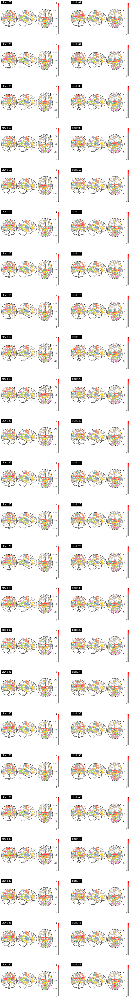

In [17]:
# nrows, ncols = 24, 2
# fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*7.5, nrows*5))
# # fig.suptitle(subj, fontsize=16)
# axs = np.concatenate(axs)

# for layer in range(48):
#     ax = axs[layer]
    
#     adjacency_matrix = mean_supraadjacency_matrix[layer,:,:]
#     ## plot connectome with 99.5% edge strength in the connectivity
#     img = nplt.plot_connectome(
#         adjacency_matrix, preproc.nodecoord
#         , edge_vmax=1., edge_vmin=0.
#         , axes=ax, title='block %02d'%(layer+1)
#         , edge_threshold='99.5%', colorbar=True
#     )

---

In [19]:
## (피험자, RUN) 별로 temporal correlation matrix(=supra-adjacency matrix)를 평균함

## (2 days, 30 subjects, 6 runs, 103 nodes, 103 nodes)
mean_adj = np.ones((2, 30, 6, 103, 103)) * np.nan
print(mean_adj.shape)

for i, (ggnn, rr) in enumerate(mdict['key']):
    gg, nn = ggnn[:2], ggnn[2:]
    ## 피험자는 총 30*2명 (GA, GB 따로)
    idx_nn = np.where(np.array(list_subj)==nn)[0][0]
    ## GA('early') vs. GB('late')
    idx_gg = 0 if gg=='GA' else (1 if gg=='GB' else 'invalid')
    ## 'practice': r01-r03, 'unpractice': r04-r06
    idx_rr = np.where(np.array(list_run)==rr)[0][0]

    ## temporal matrix를 across time(=window) 으로 평균함
    mean_adj[idx_gg, idx_nn, idx_rr, :, :] = np.nanmean(mdict['A'][i], axis=0)

print(i)
## 빠진 run 5개에는 nan으로 채움
## 'GB08': ['r05'], 'GB23': ['r01', 'r02'], 'GB36': ['r05', 'r06'],
for vv, visit in enumerate(['early', 'late']):
    for ss, subj in enumerate(list_subj):
        for rr, run in enumerate(list_run):
            if np.isnan(mean_adj[vv, ss, rr].sum()):
                gg = 'GA' if visit=='early' else ('GB' if visit=='late' else 'invalid')
                print(gg+subj, run)

(2, 30, 6, 103, 103)
354
GB08 r05
GB23 r01
GB23 r02
GB36 r05
GB36 r06


/tmp/ipykernel_215800/350754272.py:21: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


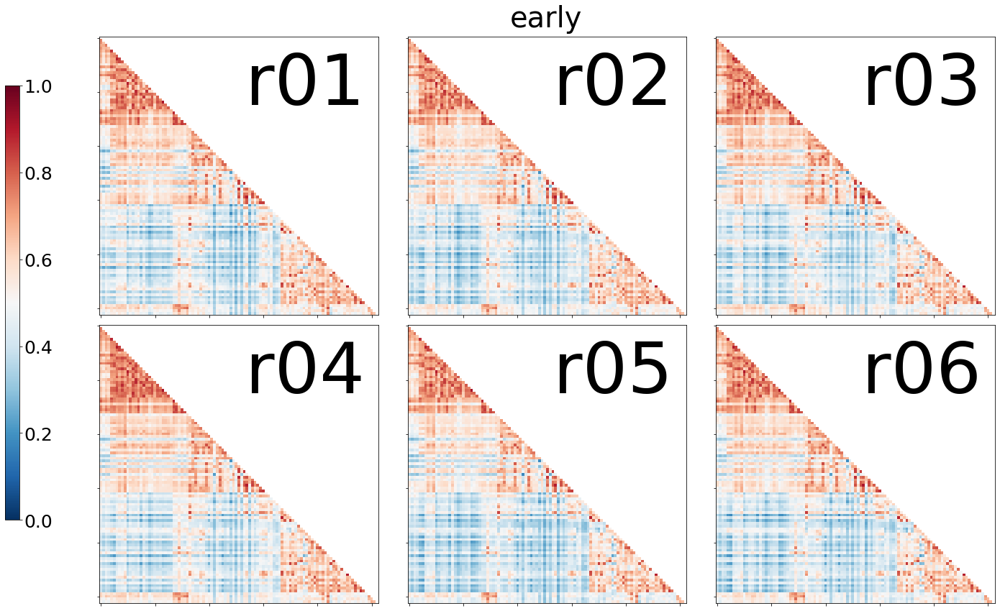

In [20]:
mean_adj_by_run = np.nanmean(mean_adj[0], axis=0)

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18,12))
axs = np.concatenate(axs)

for r, run in enumerate(list_run):
    ax = axs[r]
    img = nplt.plot_matrix(
        mat=mean_adj_by_run[r]
        , tri='lower'
        , vmax = 1, vmin = 0., colorbar=False
        , axes=ax
        , title=run
    )
fig.suptitle('early', size=40)

cax = fig.add_axes([-.08, .15, .015, .7])
cbar = fig.colorbar(img, cax=cax)
cbar.ax.tick_params(labelsize=25)

fig.tight_layout()

/tmp/ipykernel_215800/842660369.py:21: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


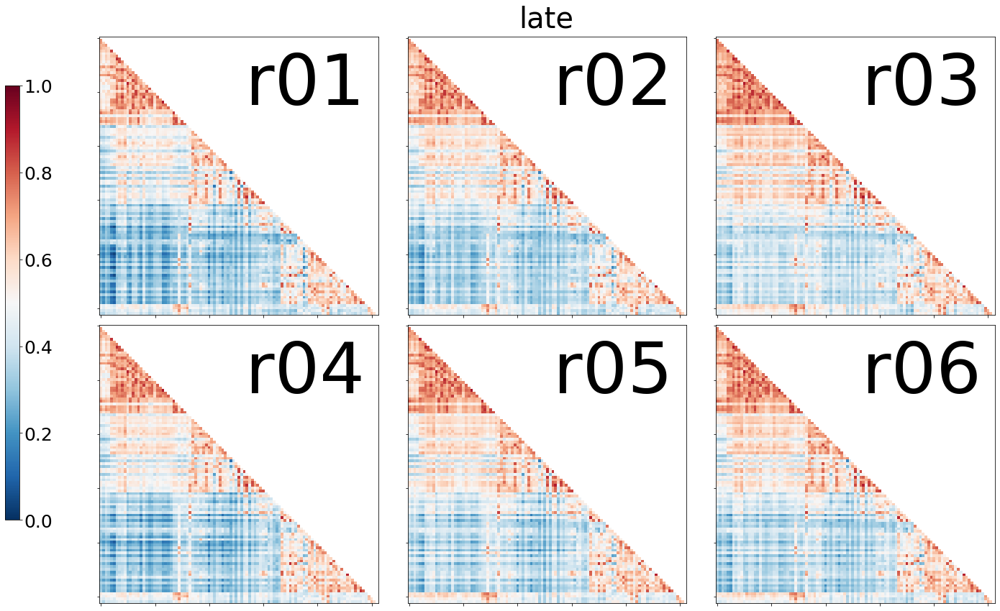

In [21]:
mean_adj_by_run = np.nanmean(mean_adj[1], axis=0)

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18,12))
axs = np.concatenate(axs)

for r, run in enumerate(list_run):
    ax = axs[r]
    img = nplt.plot_matrix(
        mat=mean_adj_by_run[r]
        , tri='lower'
        , vmax = 1, vmin = 0., colorbar=False
        , axes=ax
        , title=run
    )
fig.suptitle('late', size=40)

cax = fig.add_axes([-.08, .15, .015, .7])
cbar = fig.colorbar(img, cax=cax)
cbar.ax.tick_params(labelsize=25)

fig.tight_layout()

/tmp/ipykernel_215800/3685185973.py:21: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


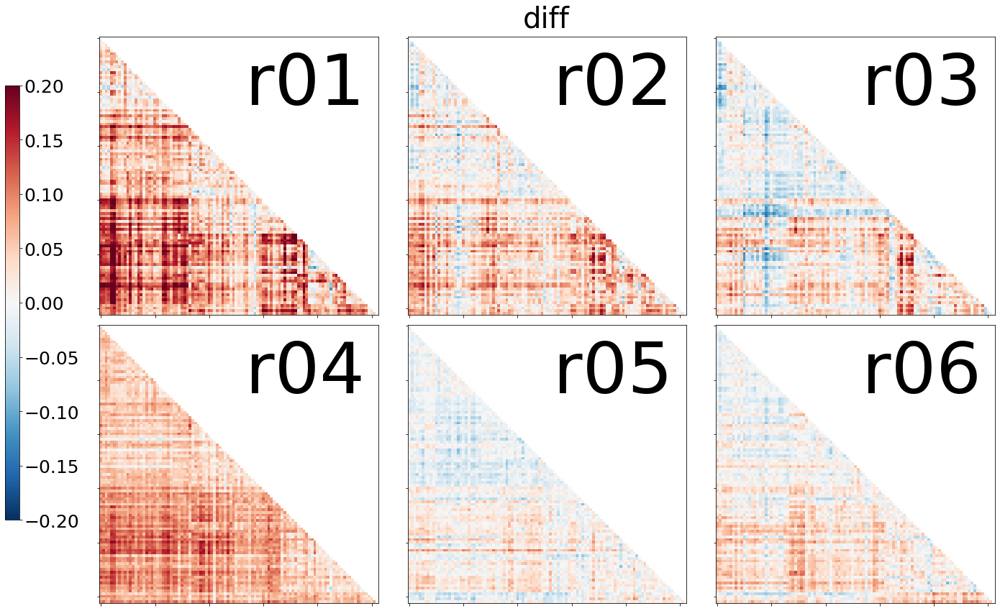

In [22]:
mean_adj_by_run = np.nanmean(mean_adj[0]-mean_adj[1], axis=0)

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(18,12))
axs = np.concatenate(axs)

for r, run in enumerate(list_run):
    ax = axs[r]
    img = nplt.plot_matrix(
        mat=mean_adj_by_run[r]
        , tri='lower'
        , vmax = .2, vmin = -.2, colorbar=False
        , axes=ax
        , title=run
    )
fig.suptitle('diff', size=40)

cax = fig.add_axes([-.08, .15, .015, .7])
cbar = fig.colorbar(img, cax=cax)
cbar.ax.tick_params(labelsize=25)

fig.tight_layout()

In [23]:
staticcommunity = []
for network, nodes in tsmean['regions'].items():
    staticcommunity.append([network for _ in nodes])
staticcommunity = np.concatenate(staticcommunity)
staticcommunity

array(['somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'vision', 'vision', 'vision', 'vision', 'vision',
       'vision', 'vision', 'vision', 'vision', 'vision', 'vision',
       'vision', 'vision', 'vision', 'vision', 'vision', 'vision',
       'vision', 'vision', 'vision', 'vision', 'vision', 'vision',
       'vision', 'vision', 'vision', 'vision', 'vision', 'vision',
       'vision', 'vision', 'vision', 'vision', 'vision', 'DMN', 'DMN',
       'DMN', 'DMN', 'DMN', 'DMN', 'DMN', 'DMN', 'DMN

In [48]:
def calc_recruitment(A, S):
    """
    INPUT
        A: numpy.ndarray
            N x N Adjacency Matrix
        S: numpy.array
            N x 1 static community made up of k networks.
    OUTPUT
        recuitment: numpy.array
            N x 1 recuitment
    """
    (N, n) = A.shape
    assert N==n
    (k,) = S.shape
    assert N==k
    
    recruitment = np.ones(N) * np.nan
    for node, network in enumerate(S):
        recruitment[node] = np.nanmean(A[node, S==network])
    
    return recruitment

In [49]:
def calc_integration(A, S):
    """
    INPUT
        A: numpy.ndarray
            N x N Adjacency Matrix
        S: numpy.array
            N x 1 static community made up of k networks.
    OUTPUT
        integration: numpy.array
            N x 1 integration
    """
    (N, n) = A.shape
    assert N==n
    (k,) = S.shape
    assert N==k
    
    integration = np.ones(N) * np.nan
    for node, network in enumerate(S):
        integration[node] = np.nanmean(A[node, S!=network])
    
    return integration

Behavioural Data

In [93]:
import pickle as pkl

## load data (2 days, 30 subjects, 48 blocks)
with open(join('/home/sungbeenpark/Github/labs/GA/behav_data/RewardRate.pkl'), 'rb') as f:
    tmp = pkl.load(f)
print(tmp.shape)

## (visit, subj, run)=(2, 30, 6) 포맷에 맞춰서 정리
performance = np.ones((2, 30, 6)) * np.nan
for vv, visit in enumerate(['early', 'late']):
    for rr, run in enumerate(list_run):
        performance[vv,:,rr] = np.mean(tmp[vv,:,8*rr:8*(rr+1)], axis=1)

(2, 30, 48)


- Performance vs. Recruitment

In [176]:
## Recruitment, 2 days, 30 subjects, 6 runs, 3 networks
R = np.ones((2,30,6,3))

networks = np.unique(staticcommunity)
for vv, visit in enumerate(['early', 'late']):
    for ss, subj in enumerate(list_subj):
        for rr, run in enumerate(list_run):
            recruitment = calc_recruitment(mean_adj[vv,ss,rr], staticcommunity)
            for nn, network in enumerate(networks):
                R[vv,ss,rr,nn] = np.mean(recruitment[staticcommunity==network])

/tmp/ipykernel_215800/2064154310.py:19: RuntimeWarning: Mean of empty slice
  recruitment[node] = np.nanmean(A[node, S==network])


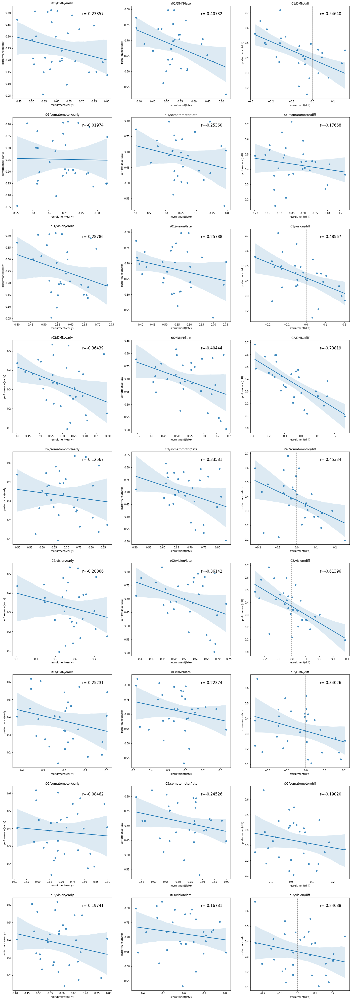

In [177]:
fig, axs = plt.subplots(nrows=3*3, ncols=3, figsize=(24, 72))

for rr, run in enumerate(list_run):
    ## pass 'unpractice'
    if rr>=3:
        continue
    for ii, network in enumerate(np.unique(staticcommunity)):
        row = rr*3 + ii
        idx = staticcommunity==network
        for col, visit in enumerate(['early', 'late', 'diff']):
            ax = axs[row,col]
            if visit == 'diff':
                x = R[1,:,rr,ii] - R[0,:,rr,ii]
                y = performance[1,:,rr] - performance[0,:,rr]
            else:
                x = R[col,:,rr,ii]
                y = performance[col,:,rr]

            X = x[~np.isnan(x)]
            Y = y[~np.isnan(x)]
            r, p = scipy.stats.pearsonr(X,Y)
            img = sns.regplot(
                x=X, y=Y, ax=ax
                , x_ci='ci'
            )
            img.set(
                title='%s/%s/%s'%(run, network, visit)
                , xlabel='recruitment(%s)'%visit, ylabel='performance(%s)'%visit
            )
            x0, x1 = img.get_xlim()
            y0, y1 = img.get_ylim()
            img.text(x0+(x1-x0)*.7, y0+(y1-y0)*.9, s='r=%.5f'%r, fontsize=15)
            if x0<=0 and x1>=0:
                ax.axvline(x=0, color='gray', linestyle='--')

- Performance vs. Integration

In [178]:
## Integration, 2 days, 30 subjects, 6 runs, 3 networks
I = np.ones((2,30,6,3))

networks = np.unique(staticcommunity)
for vv, visit in enumerate(['early', 'late']):
    for ss, subj in enumerate(list_subj):
        for rr, run in enumerate(list_run):
            integration = calc_integration(mean_adj[vv,ss,rr], staticcommunity)
            for nn, network in enumerate(networks):
                I[vv,ss,rr,nn] = np.mean(integration[staticcommunity==network])

/tmp/ipykernel_215800/3210127467.py:19: RuntimeWarning: Mean of empty slice
  integration[node] = np.nanmean(A[node, S!=network])


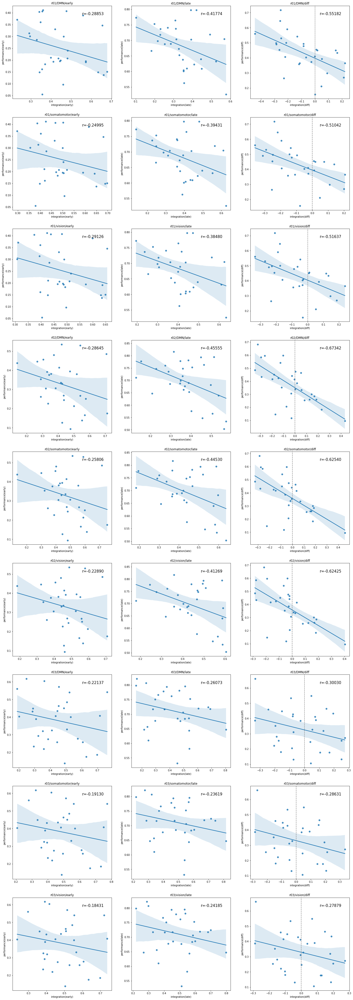

In [179]:
fig, axs = plt.subplots(nrows=3*3, ncols=3, figsize=(24, 72))

for rr, run in enumerate(list_run):
    ## pass 'unpractice'
    if rr>=3:
        continue
    for ii, network in enumerate(np.unique(staticcommunity)):
        row = rr*3 + ii
        idx = staticcommunity==network
        for col, visit in enumerate(['early', 'late', 'diff']):
            ax = axs[row,col]
            if visit == 'diff':
                x = I[1,:,rr,ii] - I[0,:,rr,ii]
                y = performance[1,:,rr] - performance[0,:,rr]
            else:
                x = I[col,:,rr,ii]
                y = performance[col,:,rr]

            X = x[~np.isnan(x)]
            Y = y[~np.isnan(x)]
            r, p = scipy.stats.pearsonr(X,Y)
            img = sns.regplot(
                x=X, y=Y, ax=ax
                , x_ci='ci'
            )
            img.set(
                title='%s/%s/%s'%(run, network, visit)
                , xlabel='integration(%s)'%visit, ylabel='performance(%s)'%visit
            )
            x0, x1 = img.get_xlim()
            y0, y1 = img.get_ylim()
            img.text(x0+(x1-x0)*.7, y0+(y1-y0)*.9, s='r=%.5f'%r, fontsize=15)
            if x0<=0 and x1>=0:
                ax.axvline(x=0, color='gray', linestyle='--')

## 3. Network Measures

### ⅰ) Communities (using Genlouvain.m)

In [53]:
# comm_whole = comm_early = scipy.io.loadmat('/home/sungbeenpark/Github/labs/GA/fmri_data/community.r=1.w=1.mat')
# comm_early = scipy.io.loadmat('/home/sungbeenpark/Github/labs/GA/fmri_data/community.r=1.w=1.early.mat')
# comm_late = scipy.io.loadmat('/home/sungbeenpark/Github/labs/GA/fmri_data/community.r=1.w=1.late.mat')
# communities = {}
# for i, nn in enumerate(list_subj):
#     nnmm = nn+'_'+'practice'
#     communities[(nnmm, 'whole')] = comm_whole['Result'][0][i]
#     communities[(nnmm, 'early')] = comm_early['Result'][0][i]
#     communities[(nnmm, 'late')] = comm_late['Result'][0][i]
#     print(nnmm, communities[(nnmm,'whole')].shape, communities[(nnmm,'early')].shape, communities[(nnmm,'late')].shape)b

# subj = '21_practice'

# fig, axs = plt.subplots(ncols=3, nrows=1, figsize=(24,8))

# for i, visit in enumerate(['whole', 'early', 'late']):
#     community = communities[(subj,visit)]
#     lencomm = community.shape[-1]
#     xlab = ['r%02d'%(i+1) for i in range(lencomm//8)]
    
#     ax = axs[i]
#     ax.imshow(community, cmap='tab20', interpolation=None, aspect='auto', origin='lower')
#     ax.set(title=visit)
#     ax.set_xticks(np.arange(0,lencomm,8), minor=False)
#     ax.set_xticklabels(xlab)
#     ax.set_xticks(np.arange(lencomm)+.5, minor=True)
#     ax.grid(axis='x', which='minor')

In [76]:
comm_practice = scipy.io.loadmat('/home/sungbeenpark/GA/GenLouvain/community.node=103.wpr=15.r=1.w=1.practice.mat')
communities = comm_practice['communities']
print(communities.shape)

# keys = comm_practice['newkey']
keys = np.empty(np.array(list(tsmean_genuine.keys())).shape, dtype='U4')
for i, (subj, run) in enumerate(tsmean_genuine.keys()):
    keys[i,:] = str(subj), str(run)

(355, 103, 15)


In [77]:
for i, key in enumerate(tsmean_genuine.keys()):
    print(key, comm_practice['communities'][i].sum())

('GA01', 'r06') nan
('GA01', 'r04') nan
('GA01', 'r05') nan
('GA01', 'r01') 2918.0
('GA01', 'r02') 2943.0
('GA01', 'r03') 2707.0
('GB01', 'r06') nan
('GB01', 'r05') nan
('GB01', 'r04') nan
('GB01', 'r01') 2232.0
('GB01', 'r03') 2890.0
('GB01', 'r02') 3215.0
('GA02', 'r01') 3251.0
('GA02', 'r02') 2992.0
('GA02', 'r03') 3640.0
('GA02', 'r04') nan
('GA02', 'r05') nan
('GA02', 'r06') nan
('GB02', 'r01') 3577.0
('GB02', 'r02') 2969.0
('GB02', 'r03') 2572.0
('GB02', 'r04') nan
('GB02', 'r05') nan
('GB02', 'r06') nan
('GA05', 'r01') 2750.0
('GA05', 'r02') 2221.0
('GA05', 'r03') 2942.0
('GA05', 'r04') nan
('GA05', 'r05') nan
('GA05', 'r06') nan
('GB05', 'r01') 2700.0
('GB05', 'r02') 2546.0
('GB05', 'r03') 2923.0
('GB05', 'r04') nan
('GB05', 'r05') nan
('GB05', 'r06') nan
('GA07', 'r01') 3281.0
('GA07', 'r02') 2617.0
('GA07', 'r03') 3300.0
('GA07', 'r04') nan
('GA07', 'r05') nan
('GA07', 'r06') nan
('GB07', 'r01') 3048.0
('GB07', 'r02') 3483.0
('GB07', 'r03') 2539.0
('GB07', 'r04') nan
('GB07',

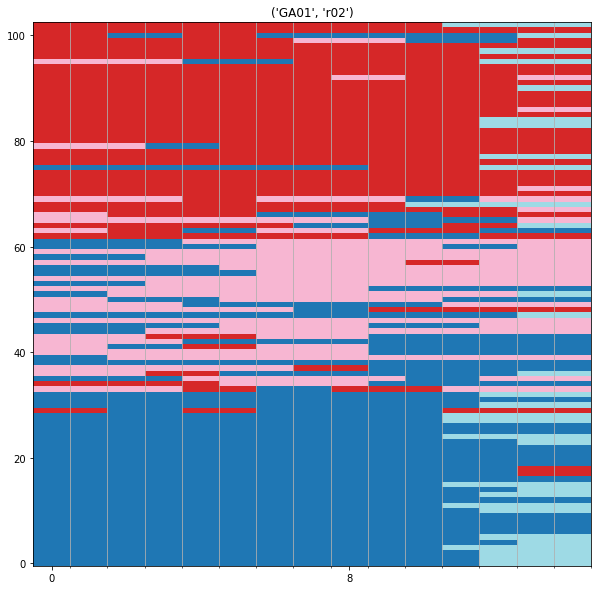

In [78]:
(subj, run) = ('GA01', 'r02')
for i, key in enumerate(keys):
    if (subj, run) == (key[0], key[1]):
        break

fig, axs = plt.subplots(ncols=1, nrows=1, figsize=(10,10))

community = communities[i,:,:]
N, T = community.shape
xlab = ['r%02d'%(i+1) for i in range(T//8)]

ax = axs
ax.imshow(community, cmap='tab20', interpolation=None, aspect='auto', origin='lower')
ax.set(title=(subj, run))
ax.set_xticks(np.arange(0,T,8), minor=False)
ax.set_xticks(np.arange(T)+.5, minor=True)
ax.grid(axis='x', which='minor')

### ⅱ) Module Allegiance Matrix

In [43]:
# import teneto.communitymeasures

# allegiances = {}
# for (nnmm, vv), comm in communities.items():
#     if vv == 'whole':
#         continue
#     allegiances[(nnmm,vv)] = teneto.communitymeasures.allegiance(comm)
#     print(nnmm, vv, allegiances[(nnmm,vv)].shape)

# n = {}
# mean_MA = {}
# for vv in ['early', 'late']:
#     n[vv] = 0
#     mean_MA[vv] = 0
    
# for (nnmm, vv), MA in allegiances.items():
#     n[vv] += 1
#     mean_MA[vv] = ( (n[vv]-1)*mean_MA[vv] + MA ) / n[vv]

/tmp/ipykernel_61143/1375400298.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


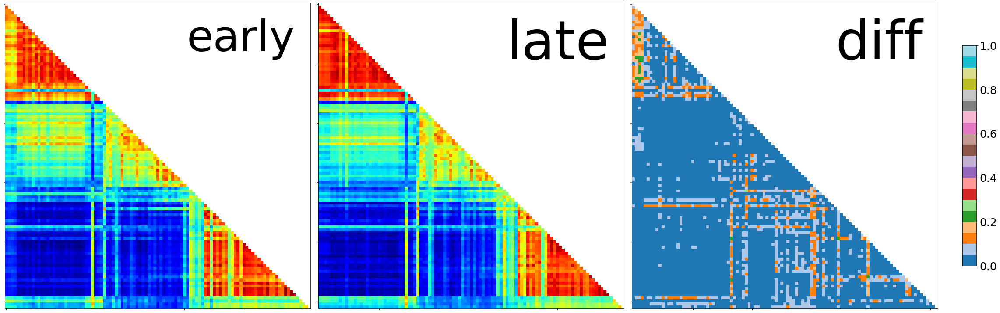

In [64]:
nrows = 1
ncols = 3
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*10, nrows*10))

for i, visit in enumerate(['early', 'late', 'diff']):
    ax = axs[i]
    if visit == 'diff':
        matrix = mean_MA['late'] - mean_MA['early']
        cmap='tab20'
    else:
        matrix = mean_MA[visit]
        cmap='jet'
        
    img = nplt.plot_matrix(
        matrix
        , vmax=1., vmin=0.
        , tri='lower', title=visit
        , cmap=cmap, colorbar=False, axes=ax
    )
cax = fig.add_axes([1.02, .15, .015, .7])
cbar = fig.colorbar(img, cax=cax)
cbar.ax.tick_params(labelsize=25)

fig.tight_layout()

In [37]:
# nrows = 1
# ncols = 1
# fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*10, nrows*10))
# ax = axs

# for i, (nnmm, MA) in enumerate(allegiance
# s.items()):
#     if i > 0:
#         MA_mean = MA_mean + MA
#     else:
#         MA_mean = MA
# MA_mean /= i+1

# img = nplt.plot_matrix(
#     MA_mean
#     , tri='lower', title='Module Allegiance Matrix'
#     , cmap='jet', colorbar=False, axes=ax)
# cax = fig.add_axes([-0.1, .15, .015, .7])
# cbar = fig.colorbar(img, cax=cax)
# cbar.ax.tick_params(labelsize=15)

# fig.tight_layout()

In [24]:
# ## vvrr(visit_run) 별로 community를 분할하여 그룹 평균(1/n) 하기 위한 변수 n 정의 및 초기화.
# ## 즉, 최종적으로 early_r01, early_r02, ..., late_r03 에 따른 평균 Module Allegiance 를 보고싶음.
# list_vvrr = []
# for vv in ['early', 'late']:
#     for rr in ['r%02d'%(i+1) for i in range(3)]:
#         list_vvrr.append(vv+'_'+rr)
        
# n = {}
# mean_MA_by_vvrr = {}
# for vvrr in list_vvrr:
#     n[vvrr] = 0
#     mean_MA_by_vvrr[vvrr] = 0

In [23]:
# ## 각 nnmm(number_mapping)별 community(# nodes x # windows)들은 누락된 RUN에 상관없이 concatenate (to use Louvain algorithm)
# ## 된 상태이기 때문에 (물론 이것들은 'practice'에만 대한 것이긴 하다.), 어떤 vvrr(visit_run) 순서에 community의 어떤 columns를 써야할 지 count 할 변수 정의가 필요하다.
# ## Note, community.shape = (# nodes, # windows)
# m = {}
# for nnmm in communities.keys():
#     m[nnmm] = 0

In [25]:
# ## gg_nn_rr (gg = vv) -> nn_mm -> vv_rr
# ## ex) GA01 & GB01 r01-03 -> 01_practice (# nodes x # windows) -> early_r01-03 & late_r01-03
# for ggnn, run in sorted(list(tsmean_genuine.keys())):
#     gg, nn = ggnn[:2], ggnn[2:]
    
#     mm = 'practice' if run in ['r01','r02','r03'] else ('unpractice' if run in ['r04','r05','r06'] else 'invalid')
#     if mm == 'unpractice':
#         continue
#     nnmm = nn+'_'+mm
#     m[nnmm] += 1
    
#     vv = 'early' if gg=='GA' else ('late' if gg=='GB' else 'invalid')
#     vvrr = vv+'_'+run
#     n[vvrr] += 1
    
#     windowed_commu = communities[nnmm][:,nwindows*(m[nnmm]-1):nwindows*m[nnmm]]
#     windowed_MA = teneto.communitymeasures.allegiance(windowed_commu)
#     mean_MA_by_vvrr[vvrr] = ( (n[vvrr]-1)*mean_MA_by_vvrr[vvrr] + windowed_MA ) / n[vvrr]

In [38]:
# nrows = 1
# ncols = 6
# fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*10, nrows*10))

# for i, (vvrr, mean_MA) in enumerate(mean_MA_by_vvrr.items()):
#     ax = axs[i]
#     img = nplt.plot_matrix(
#         mean_MA
#         , tri='lower', title=vvrr
#         , cmap='jet', colorbar=False, axes=ax
#     )
    
# cax = fig.add_axes([-0.05, .15, .005, .7])
# cbar = fig.colorbar(img, cax=cax)
# cbar.ax.tick_params(labelsize=15)

# fig.tight_layout()

In [47]:
# nrows = 1
# ncols = 3
# fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*10, nrows*10))

# MA_mean = {}
# for i, visit in enumerate(['early', 'late', 'diff']):
#     ax = axs[i]
#     if visit == 'diff':
#         MA_mean['diff'] = MA_mean['late'] - MA_mean['early']
#         cmap='tab20'
#     else:
#         MA_sum = np.zeros((103, 103))
#         n_tot = 0
#         for run in ['r01', 'r02', 'r03']:
#             vvrr = visit+'_'+run
#             MA_sum += mean_MA_by_vvrr[vvrr]*n[vvrr]
#             n_tot += n[vvrr]
#         MA_mean[visit] = MA_sum / n_tot
#         cmap='jet'
        
#     img = nplt.plot_matrix(
#         MA_mean[visit]
#         , vmax=1., vmin=0.
#         , tri='lower', title=visit
#         , cmap=cmap, colorbar=False, axes=ax
#     )
# cax = fig.add_axes([1.02, .15, .015, .7])
# cbar = fig.colorbar(img, cax=cax)
# cbar.ax.tick_params(labelsize=25)

# fig.tight_layout()

---

In [79]:
import teneto.communitymeasures

## shape: (# nodes, # nodes)
allegiances = {}
for i, comm in enumerate(communities):
    (ggnn, rr) = keys[i,:]
    ## pass 'unpractice'
    if str(rr) in ['r04', 'r05', 'r06']:
        continue
    allegiances[(ggnn,str(rr))] = teneto.communitymeasures.allegiance(comm)

In [80]:
n = {}
mean_MA = {}
for vv in ['early', 'late']:
    n[vv] = 0
    mean_MA[vv] = 0
    
for (ggnn, rr), MA in allegiances.items():
    gg = ggnn[:2]
    vv = 'early' if gg=='GA' else ('late' if gg=='GB' else 'invalid')
    n[vv] += 1
    mean_MA[vv] = ( (n[vv]-1)*mean_MA[vv] + MA ) / n[vv]

/tmp/ipykernel_94407/1375400298.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


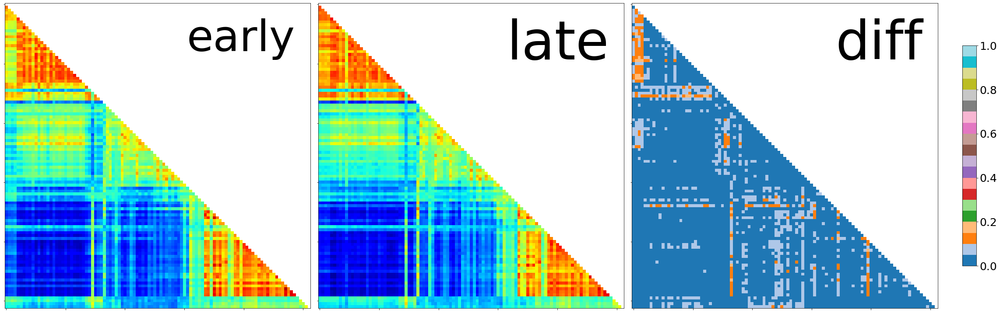

In [81]:
nrows = 1
ncols = 3
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*10, nrows*10))

for i, visit in enumerate(['early', 'late', 'diff']):
    ax = axs[i]
    if visit == 'diff':
        matrix = mean_MA['late'] - mean_MA['early']
        cmap='tab20'
    else:
        matrix = mean_MA[visit]
        cmap='jet'
        
    img = nplt.plot_matrix(
        matrix
        , vmax=1., vmin=0.
        , tri='lower', title=visit
        , cmap=cmap, colorbar=False, axes=ax
    )
cax = fig.add_axes([1.02, .15, .015, .7])
cbar = fig.colorbar(img, cax=cax)
cbar.ax.tick_params(labelsize=25)

fig.tight_layout()

/tmp/ipykernel_55261/1375400298.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


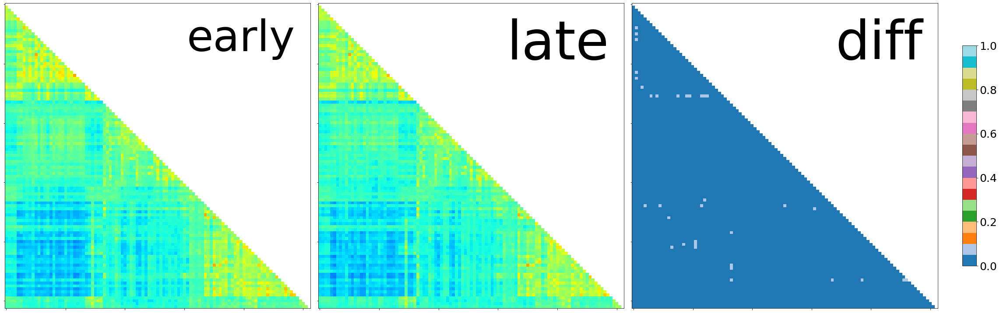

In [19]:
nrows = 1
ncols = 3
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*10, nrows*10))

for i, visit in enumerate(['early', 'late', 'diff']):
    ax = axs[i]
    if visit == 'diff':
        matrix = mean_MA['late'] - mean_MA['early']
        cmap='tab20'
    else:
        matrix = mean_MA[visit]
        cmap='jet'
        
    img = nplt.plot_matrix(
        matrix
        , vmax=1., vmin=0.
        , tri='lower', title=visit
        , cmap=cmap, colorbar=False, axes=ax
    )
cax = fig.add_axes([1.02, .15, .015, .7])
cbar = fig.colorbar(img, cax=cax)
cbar.ax.tick_params(labelsize=25)

fig.tight_layout()

### ⅲ) Integration and Recruitment

In [65]:
staticcommunity = []
for network, nodes in tsmean['regions'].items():
    staticcommunity.append([network for _ in nodes])
staticcommunity = np.concatenate(staticcommunity)
staticcommunity

array(['somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'somatomotor', 'somatomotor', 'somatomotor',
       'somatomotor', 'vision', 'vision', 'vision', 'vision', 'vision',
       'vision', 'vision', 'vision', 'vision', 'vision', 'vision',
       'vision', 'vision', 'vision', 'vision', 'vision', 'vision',
       'vision', 'vision', 'vision', 'vision', 'vision', 'vision',
       'vision', 'vision', 'vision', 'vision', 'vision', 'vision',
       'vision', 'vision', 'vision', 'vision', 'vision', 'DMN', 'DMN',
       'DMN', 'DMN', 'DMN', 'DMN', 'DMN', 'DMN', 'DMN

In [74]:
## These code produce the same outcomes
# ============================================================================== #
## From Teneto
# recruitment = {}
# integration = {}
# for nnmm, tempcomm in communities.items():
#     recruitment[nnmm] = teneto.communitymeasures.recruitment(tempcomm, staticcommunity)
#     integration[nnmm] = teneto.communitymeasures.integration(tempcomm, staticcommunity)
# ============================================================================== #

## Manually
recruitment = {}
integration = {}

for (nnmm, vv), MA in allegiances.items():
    recruitment[(nnmm,vv)] = np.zeros(nnodes)
    integration[(nnmm,vv)] = np.zeros(nnodes)
    for node, system in enumerate(staticcommunity):
        recruitment[(nnmm,vv)][node] = np.nanmean(MA[node,staticcommunity==system], axis=0)
        integration[(nnmm,vv)][node] = np.nanmean(MA[node,staticcommunity!=system], axis=0)

for key in allegiances.keys():
    print(key, recruitment[key].shape, integration[key].shape)

('01_practice', 'early') (103,) (103,)
('01_practice', 'late') (103,) (103,)
('02_practice', 'early') (103,) (103,)
('02_practice', 'late') (103,) (103,)
('05_practice', 'early') (103,) (103,)
('05_practice', 'late') (103,) (103,)
('07_practice', 'early') (103,) (103,)
('07_practice', 'late') (103,) (103,)
('08_practice', 'early') (103,) (103,)
('08_practice', 'late') (103,) (103,)
('11_practice', 'early') (103,) (103,)
('11_practice', 'late') (103,) (103,)
('12_practice', 'early') (103,) (103,)
('12_practice', 'late') (103,) (103,)
('13_practice', 'early') (103,) (103,)
('13_practice', 'late') (103,) (103,)
('14_practice', 'early') (103,) (103,)
('14_practice', 'late') (103,) (103,)
('15_practice', 'early') (103,) (103,)
('15_practice', 'late') (103,) (103,)
('18_practice', 'early') (103,) (103,)
('18_practice', 'late') (103,) (103,)
('19_practice', 'early') (103,) (103,)
('19_practice', 'late') (103,) (103,)
('20_practice', 'early') (103,) (103,)
('20_practice', 'late') (103,) (103,)

In [82]:
df_r = pd.DataFrame.from_dict(recruitment, dtype=float)
df_r['node'] = np.arange(103)+1
df_r['network'] = staticcommunity
df_r

01_practice           02_practice           05_practice            \
          early      late       early      late       early      late   
0      0.990885  0.947917    0.738281  0.856771    0.733073  0.863281   
1      0.990885  0.947917    0.750000  0.837240    0.680990  0.863281   
2      0.990885  0.947917    0.583333  0.856771    0.647135  0.863281   
3      0.990885  0.947917    0.710938  0.888021    0.519531  0.863281   
4      0.990885  0.947917    0.753906  0.880208    0.757812  0.863281   
..          ...       ...         ...       ...         ...       ...   
98     0.894048  0.915476    0.791667  0.829762    0.902381  0.860714   
99     0.583333  0.915476    0.791667  0.250000    0.490476  0.048810   
100    0.398810  0.665476    0.290476  0.186905    0.550000  0.561905   
101    0.739286  0.915476    0.538095  0.409524    0.902381  0.822619   
102    0.894048  0.915476    0.334524  0.532143    0.780952  0.385714   

    07_practice           08_practice            ... 37_practice            \
          early      late       early      late  ...       early      late   
0      0.815104  0.927083    0.856771  0.936198  ...    0.871094  0.833333   
1      0.611979  0.927083    0.924479  0.855469  ...    0.889323  0.910156   
2      0.326823  0.927083    0.817708  0.936198  ...    0.755208  0.910156   
3      0.332031  0.927083    0.812500  0.936198  ...    0.763021  0.834635   
4      0.919271  0.622396    0.924479  0.936198  ...    0.875000  0.910156   
..          ...       ...         ...       ...  ...         ...       ...   
98     0.790476  0.672619    0.811905  0.854762  ...    0.902381  0.778571   
99     0.094048  0.246429    0.397619  0.044048  ...    0.902381  0.403571   
100    0.314286  0.565476    0.592857  0.335714  ...    0.611905  0.163095   
101    0.098810  0.246429    0.696429  0.854762  ...    0.871429  0.420238   
102    0.220238  0.305952    0.846429  0.854762  ...    0.307143  0.469048   

    38_practice           42_practice           44_practice           node  \
          early      late       early      late       early      late        
0      0.653646  0.912760    0.812500  0.966146    0.916667  0.971354    1   
1      0.736979  0.912760    0.963542  0.966146    0.916667  0.971354    2   
2      0.660156  0.912760    0.963542  0.966146    0.704427  0.971354    3   
3      0.760417  0.912760    0.963542  0.966146    0.782552  0.971354    4   
4      0.804687  0.912760    0.963542  0.966146    0.916667  0.971354    5   
..          ...       ...         ...       ...         ...       ...  ...   
98     0.953571  0.961905    0.908333  0.948810    0.853571  0.860714   99   
99     0.953571  0.961905    0.501190  0.948810    0.086905  0.097619  100   
100    0.884524  0.761905    0.422619  0.539286    0.157143  0.097619  101   
101    0.953571  0.961905    0.908333  0.948810    0.719048  0.092857  102   
102    0.953571  0.961905    0.908333  0.948810    0.230952  0.166667  103   

         network  
                  
0    somatomotor  
1    somatomotor  
2    somatomotor  
3    somatomotor  
4    somatomotor  
..           ...  
98           DMN  
99           DMN  
100          DMN  
101          DMN  
102          DMN  

[103 rows x 62 columns]

In [83]:
df_r = df_r.melt(id_vars=['node', 'network'], value_name='recruitment', var_name=['nnmm', 'visit'])
df_r

,node,network,nnmm,visit,recruitment
0,1,somatomotor,01_practice,early,0.990885
1,2,somatomotor,01_practice,early,0.990885
2,3,somatomotor,01_practice,early,0.990885
3,4,somatomotor,01_practice,early,0.990885
4,5,somatomotor,01_practice,early,0.990885
...,...,...,...,...,...
6175,99,DMN,44_practice,late,0.860714
6176,100,DMN,44_practice,late,0.097619
6177,101,DMN,44_practice,late,0.097619
6178,102,DMN,44_practice,late,0.092857


In [84]:
df_i = pd.DataFrame.from_dict(integration, dtype=float)
df_i['node'] = np.arange(103)+1
df_i['network'] = staticcommunity
df_i

01_practice           02_practice           05_practice            \
          early      late       early      late       early      late   
0      0.206548  0.200000    0.226190  0.314286    0.343452  0.190476   
1      0.206548  0.200000    0.236905  0.332738    0.315476  0.190476   
2      0.206548  0.200000    0.215476  0.314286    0.301190  0.190476   
3      0.206548  0.200000    0.226786  0.318452    0.423810  0.190476   
4      0.206548  0.200000    0.242857  0.318452    0.340476  0.190476   
..          ...       ...         ...       ...         ...       ...   
98     0.060945  0.088930    0.095771  0.155473    0.141169  0.072139   
99     0.260572  0.088930    0.095771  0.574005    0.465174  0.585821   
100    0.396766  0.193408    0.361318  0.646144    0.386194  0.327114   
101    0.162313  0.088930    0.180348  0.487562    0.141169  0.120025   
102    0.060945  0.088930    0.307214  0.421642    0.256841  0.419154   

    07_practice           08_practice            ... 37_practice            \
          early      late       early      late  ...       early      late   
0      0.248214  0.177976    0.212500  0.145833  ...    0.379762  0.187500   
1      0.292262  0.177976    0.193452  0.163095  ...    0.375000  0.164881   
2      0.310714  0.177976    0.223214  0.145833  ...    0.344643  0.164881   
3      0.249405  0.177976    0.190476  0.145833  ...    0.344048  0.163690   
4      0.242262  0.277381    0.193452  0.145833  ...    0.366667  0.164881   
..          ...       ...         ...       ...  ...         ...       ...   
98     0.096393  0.198383    0.159826  0.057836  ...    0.097015  0.103234   
99     0.612562  0.470149    0.276119  0.576493  ...    0.097015  0.386194   
100    0.477612  0.269279    0.194652  0.400498  ...    0.375000  0.463930   
101    0.640547  0.470149    0.146766  0.057836  ...    0.097015  0.309080   
102    0.554104  0.405473    0.117537  0.057836  ...    0.528607  0.245025   

    38_practice           42_practice           44_practice           node  \
          early      late       early      late       early      late        
0      0.275595  0.379762    0.430952  0.362500    0.239881  0.297619    1   
1      0.282738  0.379762    0.398810  0.362500    0.239881  0.297619    2   
2      0.318452  0.379762    0.398810  0.362500    0.251786  0.297619    3   
3      0.287500  0.379762    0.398810  0.362500    0.260119  0.297619    4   
4      0.302381  0.379762    0.398810  0.362500    0.239881  0.297619    5   
..          ...       ...         ...       ...         ...       ...  ...   
98     0.077736  0.141169    0.156095  0.171642    0.088308  0.127488   99   
99     0.077736  0.141169    0.519900  0.171642    0.643035  0.723881  100   
100    0.118781  0.286070    0.577114  0.472015    0.582711  0.723881  101   
101    0.077736  0.141169    0.156095  0.171642    0.189055  0.688433  102   
102    0.077736  0.141169    0.156095  0.171642    0.547886  0.679726  103   

         network  
                  
0    somatomotor  
1    somatomotor  
2    somatomotor  
3    somatomotor  
4    somatomotor  
..           ...  
98           DMN  
99           DMN  
100          DMN  
101          DMN  
102          DMN  

[103 rows x 62 columns]

In [85]:
df_i = df_i.melt(id_vars=['node', 'network'], value_name='integration', var_name=['nnmm', 'visit'])
df_i

,node,network,nnmm,visit,integration
0,1,somatomotor,01_practice,early,0.206548
1,2,somatomotor,01_practice,early,0.206548
2,3,somatomotor,01_practice,early,0.206548
3,4,somatomotor,01_practice,early,0.206548
4,5,somatomotor,01_practice,early,0.206548
...,...,...,...,...,...
6175,99,DMN,44_practice,late,0.127488
6176,100,DMN,44_practice,late,0.723881
6177,101,DMN,44_practice,late,0.723881
6178,102,DMN,44_practice,late,0.688433


In [113]:
df = pd.merge(df_r, df_i)
df

,node,network,nnmm,visit,recruitment,integration
0,1,somatomotor,01_practice,early,0.990885,0.206548
1,2,somatomotor,01_practice,early,0.990885,0.206548
2,3,somatomotor,01_practice,early,0.990885,0.206548
3,4,somatomotor,01_practice,early,0.990885,0.206548
4,5,somatomotor,01_practice,early,0.990885,0.206548
...,...,...,...,...,...,...
6175,99,DMN,44_practice,late,0.860714,0.127488
6176,100,DMN,44_practice,late,0.097619,0.723881
6177,101,DMN,44_practice,late,0.097619,0.723881
6178,102,DMN,44_practice,late,0.092857,0.688433


In [114]:
df = df.groupby(['network', 'visit', 'nnmm']).mean()
df

node  recruitment  integration
network visit nnmm                                       
DMN     early 01_practice  85.5     0.810780     0.112528
              02_practice  85.5     0.660780     0.128818
              05_practice  85.5     0.826190     0.190247
              07_practice  85.5     0.648942     0.178828
              08_practice  85.5     0.775926     0.156354
...                         ...          ...          ...
vision  late  36_practice  50.5     0.532383     0.301879
              37_practice  50.5     0.487002     0.238349
              38_practice  50.5     0.609774     0.445599
              42_practice  50.5     0.564765     0.495489
              44_practice  50.5     0.502451     0.376030

[180 rows x 3 columns]

- Plotting the measures with behavioural data\
각 피험자별로 recruitment & integration vs. task performance 간의 어떤 상관관계가 있는가?

In [88]:
import pickle as pkl

## load data (diff: GB-GA for 6 RUNs)
with open(join('/home/sungbeenpark/Github/labs/GA/behav_data/RewardRate_improvement.pkl'), 'rb') as f:
    imp = pkl.load(f)

In [46]:
diff_behav.shape

(30, 2, 3)

In [89]:
y = np.zeros(30)
for i, (nn, diff_RewardRate_by_block) in enumerate(imp.items()):
    print(nn, diff_RewardRate_by_block.shape)
    ## We should only consider 'practice' blocks(r01-r03).
    y[i] = diff_RewardRate_by_block[:24].mean()
y

01 (48,)
02 (48,)
05 (48,)
07 (48,)
08 (48,)
11 (48,)
12 (48,)
13 (48,)
14 (48,)
15 (48,)
18 (48,)
19 (48,)
20 (48,)
21 (48,)
23 (48,)
26 (48,)
27 (48,)
28 (48,)
29 (48,)
30 (48,)
31 (48,)
32 (48,)
33 (48,)
34 (48,)
35 (48,)
36 (48,)
37 (48,)
38 (48,)
42 (48,)
44 (48,)


array([0.41741898, 0.36008102, 0.34666667, 0.41271991, 0.21287037,
       0.47524306, 0.34554398, 0.329375  , 0.54519676, 0.4193287 ,
       0.21936343, 0.31761574, 0.26476852, 0.5390162 , 0.16408565,
       0.52605324, 0.2922338 , 0.2971412 , 0.47497685, 0.150625  ,
       0.22175926, 0.16570602, 0.68708333, 0.40221065, 0.37399306,
       0.41167824, 0.52989583, 0.47359954, 0.41353009, 0.44251157])

In [122]:
numerator

array([ 0.01442441,  0.11397872, -0.05733485,  0.11451423, -0.03904091,
       -0.0540872 , -0.01157407, -0.02306177,  0.01838032,  0.02294085,
        0.03137092,  0.01622098, -0.03570688,  0.02651672,  0.02012507,
       -0.05977059,  0.0742641 , -0.03125   ,  0.09207435,  0.00449143,
       -0.03076631, -0.02651672,  0.00777363,  0.02812327,  0.03786622,
       -0.09824143,  0.02472015,  0.06915077, -0.01202322,  0.04565713])

In [123]:
denominator

array([0.79990784, 0.55874317, 0.62614345, 0.57299149, 0.61264208,
       0.61064338, 0.57168315, 0.59744678, 0.69156349, 0.55376891,
       0.68264641, 0.63829667, 0.67548149, 0.63377053, 0.53749131,
       0.59435156, 0.6862459 , 0.64810541, 0.62825451, 0.62821984,
       0.58613924, 0.59235044, 0.54719485, 0.5394291 , 0.74323904,
       0.62221218, 0.71711571, 0.6220467 , 0.74402666, 0.62536752,
       0.73680403, 0.66827749, 0.63691313, 0.68106615, 0.69325418,
       0.61513052, 0.58117732, 0.63274635, 0.607765  , 0.76452546,
       0.66644438, 0.56430837, 0.68299703, 0.73861965, 0.50573804,
       0.64211436, 0.58141788, 0.6604212 , 0.63333059, 0.61569382,
       0.65248209, 0.69093457, 0.65870998, 0.67655974, 0.63905777,
       0.69792059, 0.63955072, 0.71808904, 0.72654182, 0.68932681])

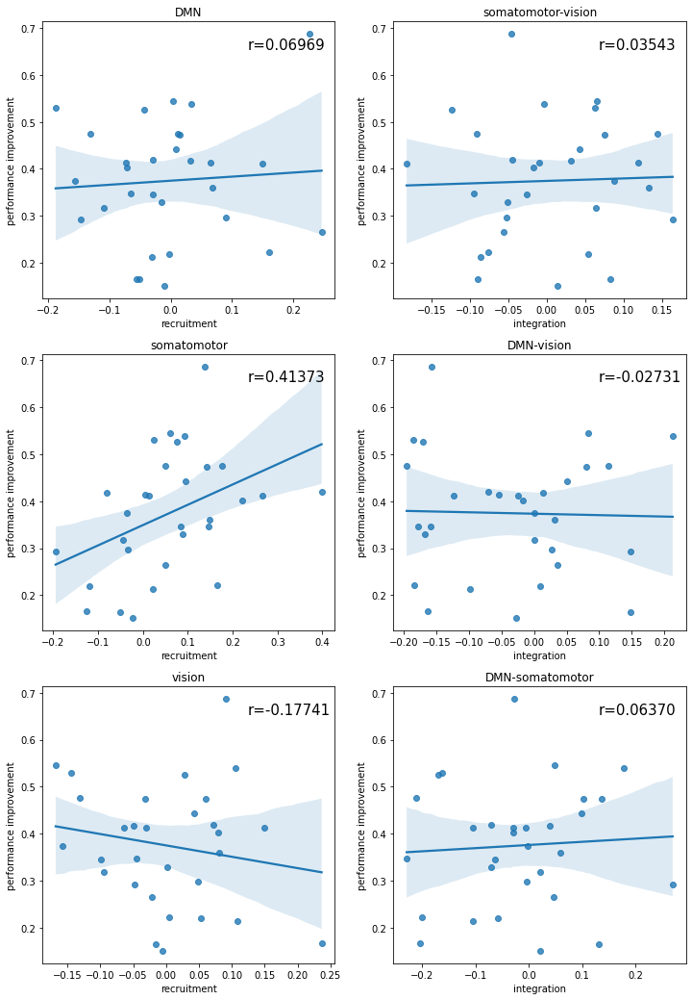

In [127]:
nrows, ncols = 3, 2
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*6, nrows*6))

networks = np.array(['DMN', 'somatomotor', 'vision'])
for i, network in enumerate(networks):
    for j, measure in enumerate(['recruitment', 'integration']):
        if measure == 'integration':
            a,b = networks[networks != network]
            ## integration = normalized late - normalized early
            denominator = np.sqrt(df.loc[a, 'late']['recruitment'].values*df.loc[b, 'late']['recruitment'].values)
            late = df.loc[network,'late']['integration'].values / denominator
            denominator = np.sqrt(df.loc[a, 'early']['recruitment'].values*df.loc[b, 'early']['recruitment'].values)
            early = df.loc[network,'early']['integration'].values / denominator
            x = late - early
        else:
            x = df.loc[network,'late'][measure].values - df.loc[network,'early'][measure].values
        ## Spearman correlation
#         r, p = scipy.stats.spearmanr(x,y)
        r, p = scipy.stats.pearsonr(x,y)
        ax = axs[i,j]
        img = sns.regplot(
            x=x, y=y, ax=ax
            , x_ci='ci'
        )
        title = '%s-%s'%(a,b) if measure=='integration' else network
        img.set(title=title, xlabel=measure, ylabel='performance improvement')
#         bbox = img.get_position()
        x0, x1 = img.get_xlim()
        y0, y1 = img.get_ylim()
        img.text(x0+(x1-x0)*.7, y0+(y1-y0)*.9, s='r=%.5f'%r, fontsize=15)

---

In [209]:
staticcommunity = []
for network, nodes in tsmean['regions'].items():
    staticcommunity.append([network for _ in nodes])
staticcommunity = np.concatenate(staticcommunity)
staticcommunity[staticcommunity!='DMN'] = 'visuomotor'
staticcommunity

array(['visuomotor', 'visuomotor', 'visuomotor', 'visuomotor',
       'visuomotor', 'visuomotor', 'visuomotor', 'visuomotor',
       'visuomotor', 'visuomotor', 'visuomotor', 'visuomotor',
       'visuomotor', 'visuomotor', 'visuomotor', 'visuomotor',
       'visuomotor', 'visuomotor', 'visuomotor', 'visuomotor',
       'visuomotor', 'visuomotor', 'visuomotor', 'visuomotor',
       'visuomotor', 'visuomotor', 'visuomotor', 'visuomotor',
       'visuomotor', 'visuomotor', 'visuomotor', 'visuomotor',
       'visuomotor', 'visuomotor', 'visuomotor', 'visuomotor',
       'visuomotor', 'visuomotor', 'visuomotor', 'visuomotor',
       'visuomotor', 'visuomotor', 'visuomotor', 'visuomotor',
       'visuomotor', 'visuomotor', 'visuomotor', 'visuomotor',
       'visuomotor', 'visuomotor', 'visuomotor', 'visuomotor',
       'visuomotor', 'visuomotor', 'visuomotor', 'visuomotor',
       'visuomotor', 'visuomotor', 'visuomotor', 'visuomotor',
       'visuomotor', 'visuomotor', 'visuomotor', 'visuo

In [210]:
recruitment = {}
integration = {}

for nnmm, MA in allegiances.items():
    nnodes = MA.shape[0]

    recruitment[nnmm] = np.zeros(nnodes)
    integration[nnmm] = np.zeros(nnodes)

    for node, system in enumerate(staticcommunity):
        recruitment[nnmm][node] = np.nanmean(MA[node,staticcommunity==system], axis=0)
        integration[nnmm][node] = np.nanmean(MA[node,staticcommunity!=system], axis=0)
        
for nnmm in allegiances.keys():
    print(nnmm, recruitment[nnmm].shape, integration[nnmm].shape)

01_practice (103,) (103,)
02_practice (103,) (103,)
05_practice (103,) (103,)
07_practice (103,) (103,)
08_practice (103,) (103,)
11_practice (103,) (103,)
12_practice (103,) (103,)
13_practice (103,) (103,)
14_practice (103,) (103,)
15_practice (103,) (103,)
18_practice (103,) (103,)
19_practice (103,) (103,)
20_practice (103,) (103,)
21_practice (103,) (103,)
23_practice (103,) (103,)
26_practice (103,) (103,)
27_practice (103,) (103,)
28_practice (103,) (103,)
29_practice (103,) (103,)
30_practice (103,) (103,)
31_practice (103,) (103,)
32_practice (103,) (103,)
33_practice (103,) (103,)
34_practice (103,) (103,)
35_practice (103,) (103,)
36_practice (103,) (103,)
37_practice (103,) (103,)
38_practice (103,) (103,)
42_practice (103,) (103,)
44_practice (103,) (103,)


In [211]:
df_r = pd.DataFrame.from_dict(recruitment, dtype=float)
df_r['node'] = np.arange(103)+1
df_r['network'] = staticcommunity

In [212]:
df_r = df_r.melt(id_vars=['node', 'network'], value_name='recruitment', var_name='nnmm')
df_r

,node,network,nnmm,recruitment
0,1,visuomotor,01_practice,0.639205
1,2,visuomotor,01_practice,0.639205
2,3,visuomotor,01_practice,0.639205
3,4,visuomotor,01_practice,0.639205
4,5,visuomotor,01_practice,0.639205
...,...,...,...,...
3085,99,DMN,44_practice,0.872619
3086,100,DMN,44_practice,0.085119
3087,101,DMN,44_practice,0.120833
3088,102,DMN,44_practice,0.357143


In [213]:
df_i = pd.DataFrame.from_dict(integration, dtype=float)
df_i['node'] = np.arange(103)+1
df_i['network'] = staticcommunity

In [214]:
df_i = df_i.melt(id_vars=['node', 'network'], value_name='integration', var_name='nnmm')
df_i

,node,network,nnmm,integration
0,1,visuomotor,01_practice,0.065972
1,2,visuomotor,01_practice,0.065972
2,3,visuomotor,01_practice,0.065972
3,4,visuomotor,01_practice,0.065972
4,5,visuomotor,01_practice,0.065972
...,...,...,...,...
3085,99,DMN,44_practice,0.106654
3086,100,DMN,44_practice,0.654229
3087,101,DMN,44_practice,0.627177
3088,102,DMN,44_practice,0.478234


In [215]:
df = pd.merge(df_r, df_i)
df

,node,network,nnmm,recruitment,integration
0,1,visuomotor,01_practice,0.639205,0.065972
1,2,visuomotor,01_practice,0.639205,0.065972
2,3,visuomotor,01_practice,0.639205,0.065972
3,4,visuomotor,01_practice,0.639205,0.065972
4,5,visuomotor,01_practice,0.639205,0.065972
...,...,...,...,...,...
3085,99,DMN,44_practice,0.872619,0.106654
3086,100,DMN,44_practice,0.085119,0.654229
3087,101,DMN,44_practice,0.120833,0.627177
3088,102,DMN,44_practice,0.357143,0.478234


In [216]:
df = df.groupby(['network', 'nnmm']).mean()
df

node  recruitment  integration
network    nnmm                                       
DMN        01_practice  85.5     0.819874     0.116915
           02_practice  85.5     0.746660     0.198590
           05_practice  85.5     0.770966     0.176928
           07_practice  85.5     0.580159     0.270142
           08_practice  85.5     0.772090     0.149254
           11_practice  85.5     0.687136     0.185954
           12_practice  85.5     0.669874     0.213352
           13_practice  85.5     0.688128     0.135097
           14_practice  85.5     0.675298     0.199964
           15_practice  85.5     0.668386     0.176150
           18_practice  85.5     0.648148     0.180193
           19_practice  85.5     0.763757     0.185021
           20_practice  85.5     0.729960     0.169508
           21_practice  85.5     0.796759     0.179450
           23_practice  85.5     0.488690     0.447476
           26_practice  85.5     0.559590     0.219156
           27_practice  85.5     0.708135     0.175986
           28_practice  85.5     0.711971     0.147068
           29_practice  85.5     0.743651     0.169767
           30_practice  85.5     0.672784     0.216599
           31_practice  85.5     0.794544     0.147233
           32_practice  85.5     0.601918     0.193451
           33_practice  85.5     0.703340     0.192933
           34_practice  85.5     0.741898     0.178491
           35_practice  85.5     0.916997     0.148347
           36_practice  85.5     0.799107     0.171832
           37_practice  85.5     0.764583     0.154436
           38_practice  85.5     0.928108     0.118729
           42_practice  85.5     0.867394     0.215977
           44_practice  85.5     0.775562     0.171996
visuomotor 01_practice  34.0     0.557054     0.116915
           02_practice  34.0     0.605071     0.198590
           05_practice  34.0     0.546727     0.176928
           07_practice  34.0     0.469612     0.270142
           08_practice  34.0     0.484387     0.149254
           11_practice  34.0     0.466795     0.185954
           12_practice  34.0     0.433260     0.213352
           13_practice  34.0     0.535646     0.135097
           14_practice  34.0     0.454555     0.199964
           15_practice  34.0     0.470724     0.176150
           18_practice  34.0     0.445113     0.180193
           19_practice  34.0     0.543504     0.185021
           20_practice  34.0     0.484302     0.169508
           21_practice  34.0     0.577378     0.179450
           23_practice  34.0     0.496198     0.447476
           26_practice  34.0     0.448798     0.219156
           27_practice  34.0     0.593246     0.175986
           28_practice  34.0     0.453716     0.147068
           29_practice  34.0     0.500179     0.169767
           30_practice  34.0     0.561888     0.216599
           31_practice  34.0     0.515152     0.147233
           32_practice  34.0     0.409995     0.193451
           33_practice  34.0     0.464646     0.192933
           34_practice  34.0     0.455026     0.178491
           35_practice  34.0     0.635271     0.148347
           36_practice  34.0     0.556846     0.171832
           37_practice  34.0     0.500782     0.154436
           38_practice  34.0     0.659958     0.118729
           42_practice  34.0     0.714486     0.215977
           44_practice  34.0     0.536984     0.171996

- Plotting the measures with behavioural data\
각 피험자별로 recruitment & integration vs. task performance 간의 어떤 상관관계가 있는가?

Text(0.6967488846185964, 0.6655878191276754, 'r=-0.23675')

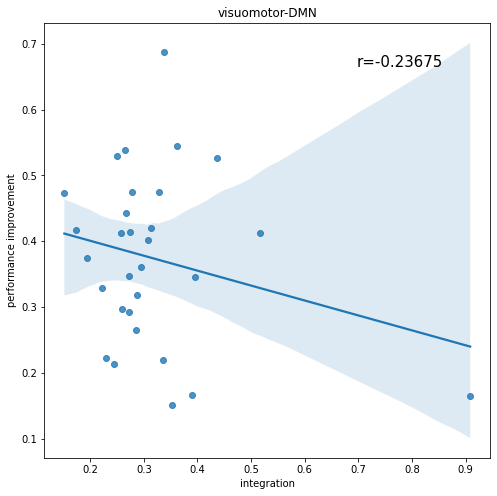

In [229]:
nrows, ncols = 1, 1
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*8, nrows*8))

a, b = ['visuomotor', 'DMN']
measure = 'integration'

denominator = np.sqrt(df.loc[a]['recruitment'].values*df.loc[b]['recruitment'].values)
## network가 둘 뿐이므로, visuomotor 와 DMN 각각의 integration 은 동일하다.
x = df.loc['visuomotor'][measure].values/denominator

## Spearman correlation
r, p = scipy.stats.spearmanr(x,y)
r, p = scipy.stats.pearsonr(x,y)
ax = axs
img = sns.regplot(
    x=x, y=y, ax=ax
    , x_ci='ci'
    , 
)
title = '%s-%s'%(a,b)
img.set(title=title, xlabel=measure, ylabel='performance improvement')
#     bbox = img.get_position()
x0, x1 = img.get_xlim()
y0, y1 = img.get_ylim()
img.text(x0+(x1-x0)*.7, y0+(y1-y0)*.9, s='r=%.5f'%r, fontsize=15)

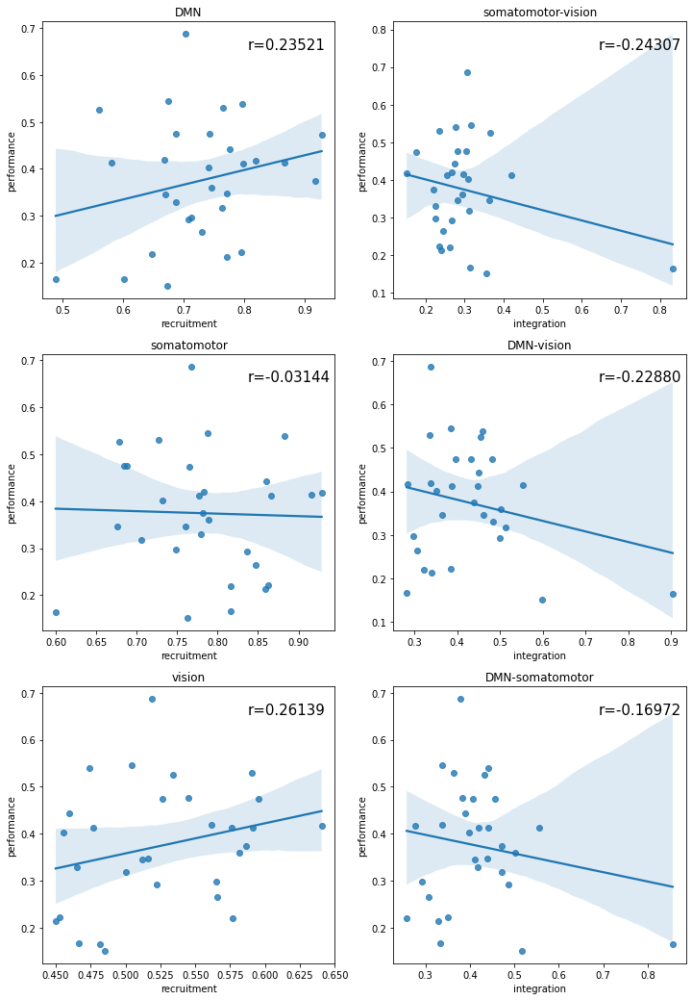

---

In [51]:
recruitment = {}
integration = {}

for stage, MA in mean_MA_by_vvrr.items():
    nnodes = MA.shape[0]
    
    recruitment[stage] = np.zeros(nnodes)
    integration[stage] = np.zeros(nnodes)
    
    for node, system in enumerate(staticcommunity):
        recruitment[stage][node] = np.nanmean(MA[node,staticcommunity==system], axis=0)
        integration[stage][node] = np.nanmean(MA[node,staticcommunity!=system], axis=0)

In [30]:
df_r = pd.DataFrame.from_dict(recruitment, dtype=float)
sys_i = np.concatenate([staticcommunity for stage in df_r.columns])

df_r = pd.melt(df_r)
df_r['w/i network'] = sys_i
df_r['metric'] = 'recruitment'
df_r

,variable,value,w/i network,metric
0,early_r01,0.650651,somatomotor,recruitment
1,early_r01,0.625911,somatomotor,recruitment
2,early_r01,0.608984,somatomotor,recruitment
3,early_r01,0.629948,somatomotor,recruitment
4,early_r01,0.713802,somatomotor,recruitment
...,...,...,...,...
613,late_r03,0.790357,DMN,recruitment
614,late_r03,0.391310,DMN,recruitment
615,late_r03,0.447500,DMN,recruitment
616,late_r03,0.530595,DMN,recruitment


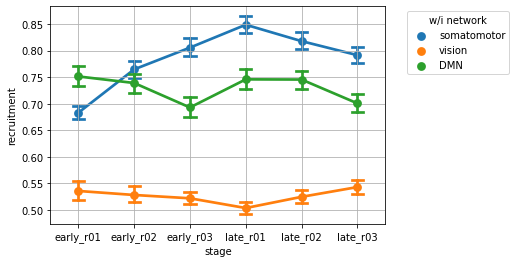

In [31]:
g = sns.pointplot(
    data=df_r, x='variable', y='value', hue='w/i network'
    , capsize=.2, ci=68
)
g.set(xlabel='stage', ylabel='recruitment')
g.grid(True)
g.legend(bbox_to_anchor=(1.05, 1.0), title='w/i network')

In [32]:
df_i = pd.DataFrame.from_dict(integration, dtype=float)
sys_i = np.concatenate([staticcommunity for stage in df_i.columns])

df_i = pd.melt(df_i)
df_i['w/o network'] = sys_i
df_i['metric'] = 'integration'
df_i

,variable,value,w/o network,metric
0,early_r01,0.244167,somatomotor,integration
1,early_r01,0.249702,somatomotor,integration
2,early_r01,0.250417,somatomotor,integration
3,early_r01,0.248274,somatomotor,integration
4,early_r01,0.263690,somatomotor,integration
...,...,...,...,...
613,late_r03,0.136754,DMN,integration
614,late_r03,0.412500,DMN,integration
615,late_r03,0.367413,DMN,integration
616,late_r03,0.325311,DMN,integration


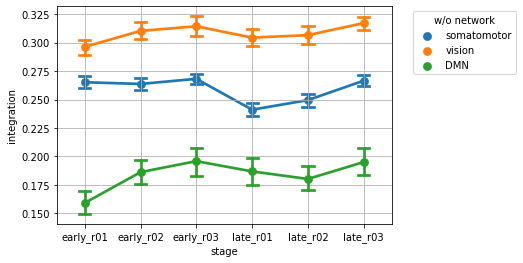

In [33]:
g = sns.pointplot(
    data=df_i, x='variable', y='value', hue='w/o network'
    , capsize=.2, ci=68
)
g.set(xlabel='stage', ylabel='integration')
g.grid(True)
g.legend(bbox_to_anchor=(1.05, 1.0), title='w/o network')

In [34]:
df = pd.concat([df_r, df_i])
df = df.reset_index(drop=True)
df

,variable,value,w/i network,metric,w/o network
0,early_r01,0.650651,somatomotor,recruitment,NaN
1,early_r01,0.625911,somatomotor,recruitment,NaN
2,early_r01,0.608984,somatomotor,recruitment,NaN
3,early_r01,0.629948,somatomotor,recruitment,NaN
4,early_r01,0.713802,somatomotor,recruitment,NaN
...,...,...,...,...,...
1231,late_r03,0.136754,NaN,integration,DMN
1232,late_r03,0.412500,NaN,integration,DMN
1233,late_r03,0.367413,NaN,integration,DMN
1234,late_r03,0.325311,NaN,integration,DMN


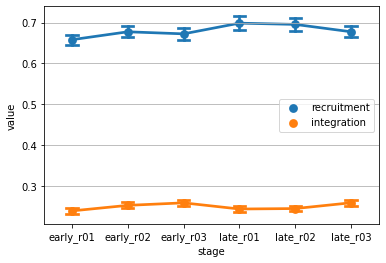

In [35]:
g = sns.pointplot(
    data=df, x='variable', y='value', hue='metric'
    , capsize=.2, ci=68
)
g.grid(True, which='major', axis='y')
g.set(xlabel='stage')
g.legend()

---

## 2. Bring about the above results

In [16]:
temp = GA.show_pkl_list(path=join(dir_tsmean) , word="corr")
# temp = GA.show_pkl_list(path=dir_stats , word="corr")
temp

,file,name,identity
0,/home/sungbeenpark/GA/pb04.errts_tproject/tsme...,20211104.df.functional_correlation.tsmean.errt...,a


In [17]:
idx = 0

print(list(temp.name)[idx])

with open(list(temp.file)[idx], 'rb') as fr:
    GA.df_functional_correlation = pickle.load(fr)
GA.df_functional_correlation

20211104.df.functional_correlation.tsmean.errts_tproject_bp.DMN-visual-localizer.pkl


,subj,stage,run,roiA,roiB,Pearson_r,pval
0,01,early_practice,r01,Core_PCC_l,Core_PCC_r,0.919076,0.000000e+00
1,01,early_practice,r01,Core_PCC_l,Core_aMPFC_l,0.681937,8.729482e-151
2,01,early_practice,r01,Core_PCC_l,Core_aMPFC_r,0.563548,7.153930e-93
3,01,early_practice,r01,Core_PCC_l,MTLsub_HF_l,0.502989,2.435466e-71
4,01,early_practice,r01,Core_PCC_l,MTLsub_HF_r,0.474898,9.785765e-63
...,...,...,...,...,...,...,...
291915,44,late_unpractice,r03,n200_c4_L_Putamen,n200_c6_R_CerebellumVIIIb,0.784278,4.757690e-229
291916,44,late_unpractice,r03,n200_c4_L_Putamen,n200_c7_L_Thalamus,0.793672,2.201720e-238
291917,44,late_unpractice,r03,n200_c5_R_SMA,n200_c6_R_CerebellumVIIIb,0.871766,0.000000e+00
291918,44,late_unpractice,r03,n200_c5_R_SMA,n200_c7_L_Thalamus,0.754028,6.409522e-202


In [18]:
sorted_rois = sorted(set(list(GA.df_functional_correlation.roiA.unique())+list(GA.df_functional_correlation.roiB.unique())))
print(len(sorted_rois), sorted_rois)

41 ['Core_PCC_l', 'Core_PCC_r', 'Core_aMPFC_l', 'Core_aMPFC_r', 'MTLsub_HF_l', 'MTLsub_HF_r', 'MTLsub_PHC_l', 'MTLsub_PHC_r', 'MTLsub_Rsp_l', 'MTLsub_Rsp_r', 'MTLsub_pIPL_l', 'MTLsub_pIPL_r', 'MTLsub_vMPFC', 'dMsub_LTC_l', 'dMsub_LTC_r', 'dMsub_TPJ_l', 'dMsub_TPJ_r', 'dMsub_TempP_l_temp', 'dMsub_TempP_r_temp', 'dMsub_dMPFC', 'fan105', 'fan106', 'fan189', 'fan190', 'fan193', 'fan194', 'fan196', 'fan199', 'fan200', 'fan203', 'fan204', 'fan205', 'fan206', 'fan209', 'n200_c1_L_Postcentral', 'n200_c2_R_CerebellumIV-V', 'n200_c3_R_Postcentral', 'n200_c4_L_Putamen', 'n200_c5_R_SMA', 'n200_c6_R_CerebellumVIIIb', 'n200_c7_L_Thalamus']


In [19]:
rois_ = {}

rois_['Core'] = sorted_rois[:4]
rois_['MTLsub'] = sorted_rois[4:13]
rois_['dMsub'] = sorted_rois[13:20]
# rois_['DMN'] = sorted_rois[:20]
# rois_['task-negative'] = sorted_rois[:20]
rois_['Yeo1'] = sorted_rois[20:34]
rois_['localizer'] = sorted_rois[34:]
# rois_['task-positive'] = sorted_rois[20:]

rois_

{'Core': ['Core_PCC_l', 'Core_PCC_r', 'Core_aMPFC_l', 'Core_aMPFC_r'],
 'MTLsub': ['MTLsub_HF_l',
  'MTLsub_HF_r',
  'MTLsub_PHC_l',
  'MTLsub_PHC_r',
  'MTLsub_Rsp_l',
  'MTLsub_Rsp_r',
  'MTLsub_pIPL_l',
  'MTLsub_pIPL_r',
  'MTLsub_vMPFC'],
 'dMsub': ['dMsub_LTC_l',
  'dMsub_LTC_r',
  'dMsub_TPJ_l',
  'dMsub_TPJ_r',
  'dMsub_TempP_l_temp',
  'dMsub_TempP_r_temp',
  'dMsub_dMPFC'],
 'Yeo1': ['fan105',
  'fan106',
  'fan189',
  'fan190',
  'fan193',
  'fan194',
  'fan196',
  'fan199',
  'fan200',
  'fan203',
  'fan204',
  'fan205',
  'fan206',
  'fan209'],
 'localizer': ['n200_c1_L_Postcentral',
  'n200_c2_R_CerebellumIV-V',
  'n200_c3_R_Postcentral',
  'n200_c4_L_Putamen',
  'n200_c5_R_SMA',
  'n200_c6_R_CerebellumVIIIb',
  'n200_c7_L_Thalamus']}

In [20]:
## A array representing group types
group = []
cnt = 1
for _, value in rois_.items():
    temp = np.ones(len(value)) * cnt
    group.append(temp)
    cnt += 1
group = np.concatenate(group).astype(int)
group

array([1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5])

In [21]:
def comb_group(group):
    list_ = np.unique(group).astype(int)

    res = []
    for i, g1 in enumerate(list_):
        for g2 in list_[:i+1]:
            res.append(sorted([g1, g2]))
    return res

comb_group(group)

[[1, 1],
 [1, 2],
 [2, 2],
 [1, 3],
 [2, 3],
 [3, 3],
 [1, 4],
 [2, 4],
 [3, 4],
 [4, 4],
 [1, 5],
 [2, 5],
 [3, 5],
 [4, 5],
 [5, 5]]

## 3. Calculating Interaction Strength through Quick & Dirty Method

In [61]:
# ## The module 'GA.make_df_correlation_matrix' is work?
# subj = '01'
# stage = 'early_practice'

# print(subj, stage)
# GA.make_df_correlation_matrix(subj, stage, group=group)

01 early_practice


,Core_PCC_l,Core_PCC_r,Core_aMPFC_l,Core_aMPFC_r,MTLsub_HF_l,MTLsub_HF_r,MTLsub_PHC_l,MTLsub_PHC_r,MTLsub_Rsp_l,MTLsub_Rsp_r,...,fan205,fan206,fan209,n200_c1_L_Postcentral,n200_c2_R_CerebellumIV-V,n200_c3_R_Postcentral,n200_c4_L_Putamen,n200_c5_R_SMA,n200_c6_R_CerebellumVIIIb,n200_c7_L_Thalamus
Core_PCC_l,1.000000,7.577394e-01,0.491476,0.235557,0.126397,0.174820,0.334961,0.313497,0.541244,0.408759,...,-0.054201,-0.030146,-0.025121,-0.204729,-0.091439,-0.304586,-0.302827,-0.336165,-0.050626,-0.161172
Core_PCC_r,0.757739,1.000000e+00,0.404031,0.278788,0.119604,0.204276,0.268253,0.378443,0.462809,0.479225,...,-0.007597,-0.094665,0.060216,-0.259924,-0.151352,-0.292459,-0.290367,-0.353308,-0.160852,-0.143256
Core_aMPFC_l,0.491476,4.040314e-01,1.000000,0.818673,0.104625,0.043062,0.245759,0.188357,0.214524,0.115999,...,-0.104500,-0.128210,-0.234768,-0.162949,-0.286425,-0.247084,-0.097207,-0.227908,-0.262187,-0.112429
Core_aMPFC_r,0.235557,2.787883e-01,0.818673,1.000000,0.073671,0.009394,0.228021,0.165806,0.088578,0.053198,...,-0.035669,-0.189815,-0.185897,-0.100004,-0.219753,-0.143526,0.008670,-0.090115,-0.251061,-0.003072
MTLsub_HF_l,0.126397,1.196041e-01,0.104625,0.073671,1.000000,0.188739,0.398089,0.205843,0.209902,0.080877,...,-0.003922,-0.070475,-0.039022,-0.114125,-0.003547,-0.088065,-0.085863,-0.084208,0.055315,0.082893
MTLsub_HF_r,0.174820,2.042763e-01,0.043062,0.009394,0.188739,1.000000,0.283065,0.363493,0.288571,0.281827,...,0.015962,-0.016701,0.007595,-0.113158,0.144914,0.041844,-0.019053,-0.070247,0.113286,-0.021863
MTLsub_PHC_l,0.334961,2.682526e-01,0.245759,0.228021,0.398089,0.283065,1.000000,0.593640,0.524066,0.331196,...,0.114053,-0.149797,0.158896,-0.101934,0.106667,0.000398,0.023257,-0.033220,0.047780,0.115763
MTLsub_PHC_r,0.313497,3.784432e-01,0.188357,0.165806,0.205843,0.363493,0.593640,1.000000,0.493866,0.527509,...,0.062800,-0.071813,0.134356,-0.079021,0.164489,0.055011,-0.030335,-0.050325,0.068592,-0.035730
MTLsub_Rsp_l,0.541244,4.628094e-01,0.214524,0.088578,0.209902,0.288571,0.524066,0.493866,1.000000,0.688620,...,0.103855,0.006010,0.137338,-0.172600,-0.016228,-0.239935,-0.175029,-0.193071,-0.044177,-0.055262
MTLsub_Rsp_r,0.408759,4.792253e-01,0.115999,0.053198,0.080877,0.281827,0.331196,0.527509,0.688620,1.000000,...,0.150842,0.092518,0.088775,-0.127519,-0.006100,-0.167876,-0.154688,-0.157090,-0.053335,-0.094249


In [22]:
subjs = GA.df_functional_correlation.subj.unique()
subjs

array(['01', '02', '05', '07', '08', '11', '12', '13', '14', '15', '18',
       '19', '20', '21', '23', '26', '27', '28', '29', '30', '31', '32',
       '33', '34', '35', '36', '37', '38', '42', '44'], dtype=object)

In [23]:
## Initializing a result variable
res = {}
for [g1,g2] in comb_group(group):
    res[(g1,g2)] = []

tmp = {}
## Main calculation
for subj in tqdm(subjs):
    corrmat = {}
    I = {}

    ## Matrix implementation & initializing an interaction variable
    for stage in ['early_practice', 'late_practice']:
        corrmat[stage] = GA.make_df_correlation_matrix(subj, stage, group=group)
        for [g1,g2] in comb_group(group):
            I[stage, (g1,g2)] = []
    ## Inserting elements of the matrix one by one
    for stage in ['early_practice', 'late_practice']:
        for a, roiA in enumerate(sorted_rois):
            for b, roiB in enumerate(sorted_rois):
                [g1,g2] = sorted([group[a], group[b]])
                element = corrmat[stage].loc[roiA][roiB]
                I[stage, (g1,g2)].append(element)

    ## Normalizing interaction strength
    Ip = {}
    for [g1,g2] in comb_group(group):
        for stage in ['early_practice', 'late_practice']:
            if g1==g2:
                Ip[stage,(g1,g2)] = np.mean(I[stage,(g1,g2)])
            else:
                Ip[stage,(g1,g2)] = np.mean(I[stage,(g1,g2)])/np.sqrt(np.mean(I[stage,(g1,g1)])*np.mean(I[stage,(g2,g2)]))
            tmp[(subj,stage,g1,g2)] = Ip[stage,(g1,g2)]
        res[(g1,g2)].append(Ip['late_practice',(g1,g2)] - Ip['early_practice',(g1,g2)])

100%|██████████| 30/30 [00:28<00:00,  1.06it/s]


In [16]:
# ## check the validation

# for stage in GA.list_stage:
#     for [g1,g2] in comb_group(group):
#         n_g1 = (group == g1).sum()
#         n_g2 = (group == g2).sum()
#         correction = 1 if g1==g2 else 2
#         print(subj, stage, g1, g2, '%d*%d*%d='%(n_g1, n_g2, correction), len(I[stage, (g1,g2)]))

## 4. Correlation between the change in the visual-DMN core integration and improvement in success rate

In [24]:
def convert_key_into_regions(rois, key):
    (g1,g2) = key
    a, b = list(rois.keys())[g1-1], list(rois.keys())[g2-1]
    return a, b

In [25]:
def plot_interaction(X, Y, key, ax):
    ax = sns.regplot(x=X, y=Y, ci=GA.sig1*100, truncate=False, ax=ax)
    a, b = convert_key_into_regions(rois=rois_, key=key)
    ax.set_ylabel('Reward GB-GA')
    ax.set_xlabel('%s_%s GB-GA'%(a,b))
    ax.set_title('r=%.4f (p=%.3f)' % (*scipy.stats.pearsonr(x=X, y=Y),))
    ax.set_xlim(-0.6, 0.6)
    ax.set_ylim(-0., 0.8)
    ax.axvline(x=0, color='k', linestyle='--', alpha=0.25)

In [26]:
df = pd.DataFrame(columns=['subj', 'stage', 'groupA', 'groupB', 'int_str'])
for i, ((subj, stage, a, b), val) in enumerate(tmp.items()):
    df.loc[i,'subj'] = subj
    df.loc[i,'stage'] = stage
    df.loc[i,'groupA'] = a
    df.loc[i,'groupB'] = b
    df.loc[i,'int_str'] = val
df

,subj,stage,groupA,groupB,int_str
0,01,early_practice,1,1,0.844572
1,01,late_practice,1,1,0.696322
2,01,early_practice,1,2,0.87115
3,01,late_practice,1,2,0.82447
4,01,early_practice,2,2,0.69683
...,...,...,...,...,...
895,44,late_practice,3,5,0.224339
896,44,early_practice,4,5,0.651247
897,44,late_practice,4,5,0.682651
898,44,early_practice,5,5,0.703644


[(1, 1), (2, 2), (3, 3)]


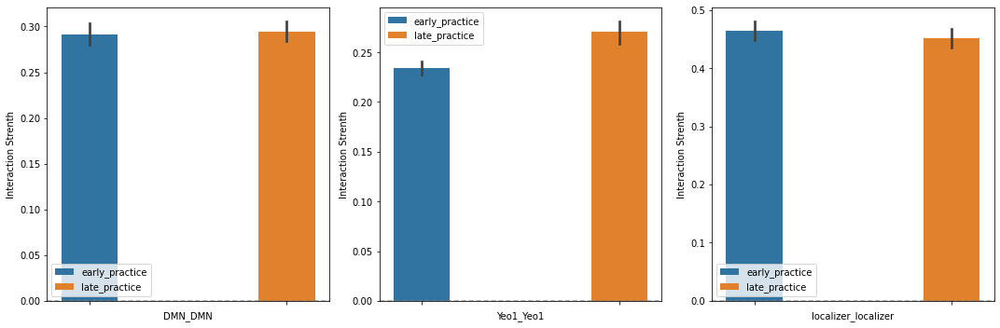

In [22]:
tmp = []
for g1, g2 in res.keys():
    if g1==g2:
        tmp.append((g1,g2))
print(tmp)
ncol=len(tmp)

fig, axs = plt.subplots(nrows=1, ncols=ncol, figsize=(ncol*5,5))
for i, (a, b) in enumerate(tmp):
    ax = axs[i] if ncol > 1 else axs
    ax = sns.barplot(x='stage', y='int_str', hue='stage'
                     , data=df[(df.groupA==a) & (df.groupB==b)]
                     , ax=ax, ci=GA.sig1*100)
    p, q = convert_key_into_regions(rois_, (a,b))
    ax.set(xlabel="%s_%s"%(p,q), ylabel="Interaction Strenth", xticks=(-0.2, 1.2))
    ax.axhline(y=0, color='gray', linestyle='--', alpha=.8)
    ax.legend(loc='best')
fig.tight_layout() 

[(1, 1), (2, 2), (3, 3), (4, 4), (5, 5)]


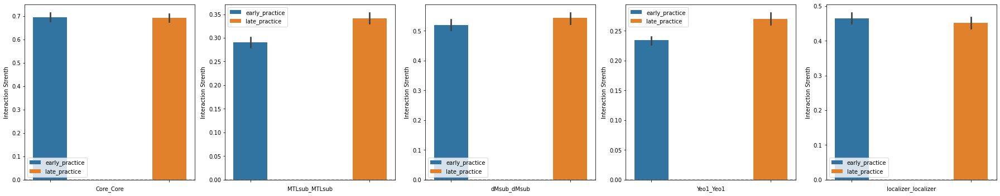

In [34]:
tmp = []
for g1, g2 in res.keys():
    if g1==g2:
        tmp.append((g1,g2))
print(tmp)
ncol=len(tmp)

fig, axs = plt.subplots(nrows=1, ncols=ncol, figsize=(ncol*5,5))
for i, (a, b) in enumerate(tmp):
    ax = axs[i] if ncol > 1 else axs
    ax = sns.barplot(x='stage', y='int_str', hue='stage'
                     , data=df[(df.groupA==a) & (df.groupB==b)]
                     , ax=ax, ci=GA.sig1*100)
    p, q = convert_key_into_regions(rois_, (a,b))
    ax.set(xlabel="%s_%s"%(p,q), ylabel="Interaction Strenth", xticks=(-0.2, 1.2))
    ax.axhline(y=0, color='gray', linestyle='--', alpha=.8)
    ax.legend(loc='best')
fig.tight_layout() 

[(1, 2), (1, 3), (2, 3), (1, 4), (2, 4), (3, 4), (1, 5), (2, 5), (3, 5), (4, 5)]


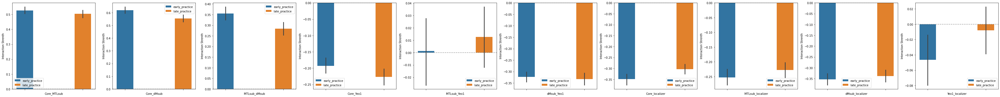

In [31]:
tmp = []
for g1, g2 in res.keys():
    if g1!=g2:
        tmp.append((g1,g2))
print(tmp)
ncol=len(tmp)

fig, axs = plt.subplots(nrows=1, ncols=ncol, figsize=(ncol*5,5))
for i, (a, b) in enumerate(tmp):
    ax = axs[i] if ncol > 1 else axs
    ax = sns.barplot(x='stage', y='int_str', hue='stage'
                     , data=df[(df.groupA==a) & (df.groupB==b)]
                     , ax=ax, ci=GA.sig1*100)
    p, q = convert_key_into_regions(rois_, (a,b))
    ax.set(xlabel="%s_%s"%(p,q), ylabel="Interaction Strenth", xticks=(-0.2, 1.2))
    ax.axhline(y=0, color='gray', linestyle='--', alpha=.8)
    ax.legend(loc='best')
fig.tight_layout() 

[(1, 1), (2, 2), (3, 3)]


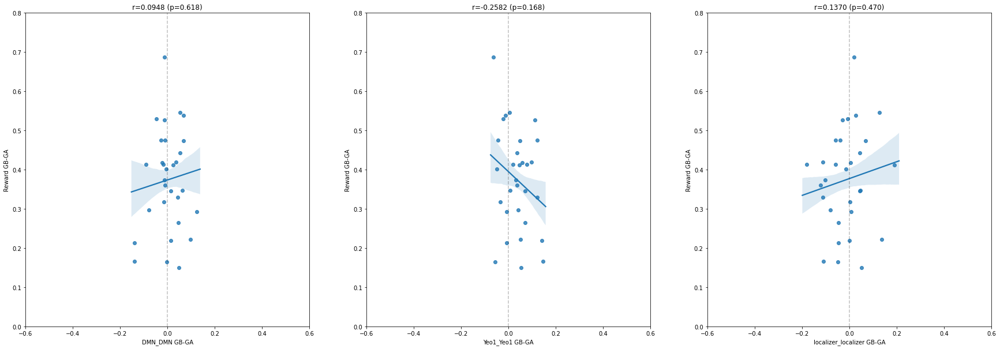

In [21]:
Y = GA.del_RewardRate

tmp = []
for g1, g2 in res.keys():
    if g1==g2:
        tmp.append((g1,g2))
print(tmp)
ncol=len(tmp)
fig, axs = plt.subplots(nrows=1, ncols=ncol, figsize=(10*ncol,10))
for i, (g1, g2) in enumerate(tmp):
    key = (g1,g2)
    X = res[key]
    ax = axs[i] if ncol > 1 else axs
    plot_interaction(X, Y, key=key, ax=ax)

# fig.savefig(fname=join(GA.dir_git, 'GA/images/%s.DMN_Yeo17_Localizer.png'%GA.today))

[(1, 1), (2, 2), (3, 3), (4, 4), (5, 5)]


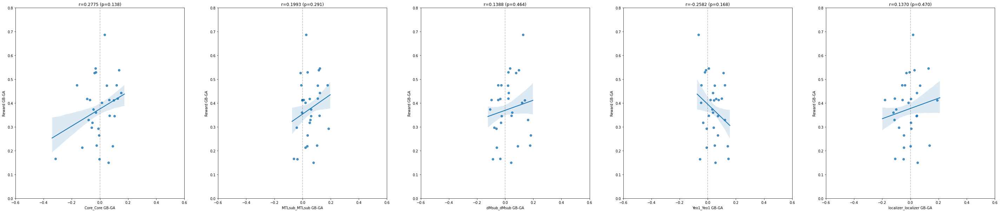

In [35]:
Y = GA.del_RewardRate

tmp = []
for g1, g2 in res.keys():
    if g1==g2:
        tmp.append((g1,g2))
print(tmp)
ncol=len(tmp)
fig, axs = plt.subplots(nrows=1, ncols=ncol, figsize=(10*ncol,10))
for i, (g1, g2) in enumerate(tmp):
    key = (g1,g2)
    X = res[key]
    ax = axs[i] if ncol > 1 else axs
    plot_interaction(X, Y, key=key, ax=ax)

# fig.savefig(fname=join(GA.dir_git, 'GA/images/%s.DMN_Yeo17_Localizer.png'%GA.today))

[(1, 2), (1, 3), (2, 3), (1, 4), (2, 4), (3, 4), (1, 5), (2, 5), (3, 5), (4, 5)]


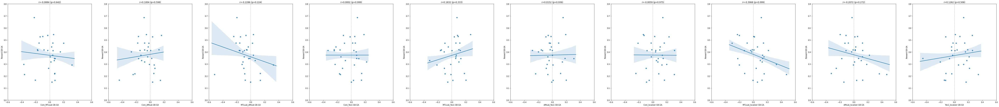

In [33]:
Y = GA.del_RewardRate

tmp = []
for g1, g2 in res.keys():
    if g1!=g2:
        tmp.append((g1,g2))
print(tmp)
ncol=len(tmp)
fig, axs = plt.subplots(nrows=1, ncols=ncol, figsize=(10*ncol,10))
for i, (g1, g2) in enumerate(tmp):
    key = (g1,g2)
    X = res[key]
    ax = axs[i] if ncol > 1 else axs
    plot_interaction(X, Y, key=key, ax=ax)

# fig.savefig(fname=join(GA.dir_git, 'GA/images/%s.DMN_Yeo17_Localizer.png'%GA.today))

In [40]:
## Lower-Tailed t-Test
for key, X in res.items():
    a, b = convert_key_into_regions(rois=rois_, key=key)
    print('%s_%s: '%(a,b), scipy.stats.ttest_1samp(X, popmean=0, alternative='less'))

Core_MTLsub:  Ttest_1sampResult(statistic=-0.5031853648069866, pvalue=0.3093172843455292)
Core_dMsub:  Ttest_1sampResult(statistic=-1.8389392866110417, pvalue=0.038092374218060124)
MTLsub_dMsub:  Ttest_1sampResult(statistic=-1.5232393283880237, pvalue=0.06926517586661736)
Core_Yeo1:  Ttest_1sampResult(statistic=-1.6866634022973457, pvalue=0.05119920802059884)
MTLsub_Yeo1:  Ttest_1sampResult(statistic=-0.10394801983195168, pvalue=0.45896308286073284)
dMsub_Yeo1:  Ttest_1sampResult(statistic=-0.7376055971236735, pvalue=0.23334046662847846)
Core_localizer:  Ttest_1sampResult(statistic=1.643233870519712, pvalue=0.9444326135197341)
MTLsub_localizer:  Ttest_1sampResult(statistic=1.7817133345909144, pvalue=0.9573640317994856)
dMsub_localizer:  Ttest_1sampResult(statistic=0.774397278212658, pvalue=0.7775179945229775)
Yeo1_localizer:  Ttest_1sampResult(statistic=2.6080197535951757, pvalue=0.9928784567007052)


In [41]:
## Spearman correlation
for key, X in res.items():
    a, b = convert_key_into_regions(rois=rois_, key=key)
    print('%s_%s: '%(a,b), scipy.stats.spearmanr(X,Y))

Core_MTLsub:  SpearmanrResult(correlation=-0.1657397107897664, pvalue=0.3814126631130643)
Core_dMsub:  SpearmanrResult(correlation=0.020244716351501667, pvalue=0.9154364690235781)
MTLsub_dMsub:  SpearmanrResult(correlation=-0.2978865406006674, pvalue=0.10986475097952342)
Core_Yeo1:  SpearmanrResult(correlation=-0.14260289210233593, pvalue=0.4522110901221206)
MTLsub_Yeo1:  SpearmanrResult(correlation=0.13770856507230256, pvalue=0.4680352613626606)
dMsub_Yeo1:  SpearmanrResult(correlation=-0.18086763070077863, pvalue=0.3388306028207365)
Core_localizer:  SpearmanrResult(correlation=-0.06518353726362626, pvalue=0.7321863531135642)
MTLsub_localizer:  SpearmanrResult(correlation=-0.32591768631813123, pvalue=0.07881177902493001)
dMsub_localizer:  SpearmanrResult(correlation=-0.16796440489432704, pvalue=0.3749634783778568)
Yeo1_localizer:  SpearmanrResult(correlation=-0.08120133481646273, pvalue=0.6696960474318825)


In [42]:
## wilcoxon signed rank test
for key, X in res.items():
    a, b = convert_key_into_regions(rois=rois_, key=key)
    print('%s_%s: '%(a,b), scipy.stats.wilcoxon(X))

Core_MTLsub:  WilcoxonResult(statistic=215.0, pvalue=0.7188875621362669)
Core_dMsub:  WilcoxonResult(statistic=154.0, pvalue=0.10639417319061394)
MTLsub_dMsub:  WilcoxonResult(statistic=141.0, pvalue=0.05983560139134924)
Core_Yeo1:  WilcoxonResult(statistic=136.0, pvalue=0.04716174720825457)
MTLsub_Yeo1:  WilcoxonResult(statistic=213.0, pvalue=0.6883592982254604)
dMsub_Yeo1:  WilcoxonResult(statistic=161.0, pvalue=0.14138951131633032)
Core_localizer:  WilcoxonResult(statistic=171.0, pvalue=0.20588822305607402)
MTLsub_localizer:  WilcoxonResult(statistic=157.0, pvalue=0.12044472790832522)
dMsub_localizer:  WilcoxonResult(statistic=204.0, pvalue=0.5577426862039239)
Yeo1_localizer:  WilcoxonResult(statistic=105.0, pvalue=0.008729667753602288)


## 5. *Drawing functional connectivity matrices (run once), then save it

In [28]:
list_ = []
stages = GA.list_stage
for i, subj in enumerate(subjs):
    for j, stage in enumerate(stages):  
        list_.append((subj, stage))

100%|██████████| 120/120 [09:55<00:00,  4.96s/it]


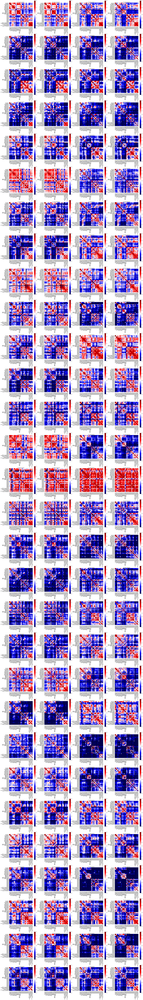

In [29]:
fig, axs = plt.subplots(nrows=len(subjs), ncols=len(stages), figsize=(len(stages)*10, len(subjs)*10))
if len(axs.shape)!=1:
    axs = np.concatenate(axs)

corrmats = {}
for i, (subj, stage) in enumerate(tqdm(list_)):
    corrmat = GA.make_df_correlation_matrix(subj, stage=stage, group=group)
    ## plot matrices by an individual subject
    ax = sns.heatmap(corrmat
                     , square=True, cmap='seismic', cbar=True
                     , robust=True
                     , vmin=0.2, vmax=1.
                     , xticklabels=sorted_rois, yticklabels=sorted_rois, ax=axs[i])
    ax.set_title('%s, %s'%(subj, stage))
    if i<len(stages):
        corrmats[stage] = corrmat
    else:
        corrmats[stage] += corrmat        

100%|██████████| 120/120 [09:51<00:00,  4.93s/it]


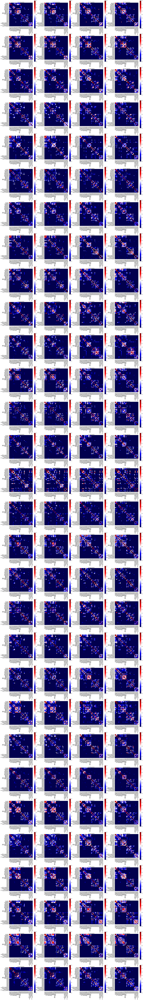

In [15]:
fig, axs = plt.subplots(nrows=len(subjs), ncols=len(stages), figsize=(len(stages)*10, len(subjs)*10))
if len(axs.shape)!=1:
    axs = np.concatenate(axs)

corrmats = {}
for i, (subj, stage) in enumerate(tqdm(list_)):
    corrmat = GA.make_df_correlation_matrix(subj, stage=stage, group=group)
    ## plot matrices by an individual subject
    ax = sns.heatmap(corrmat
                     , square=True, cmap='seismic', cbar=True
                     , robust=True
                     , vmin=0.2, vmax=1.
                     , xticklabels=sorted_rois, yticklabels=sorted_rois, ax=axs[i])
    ax.set_title('%s, %s'%(subj, stage))
    if i<len(stages):
        corrmats[stage] = corrmat
    else:
        corrmats[stage] += corrmat        

In [15]:
fig.savefig(fname=join(GA.dir_git,'GA/images/%s.individual_connectivity_matrices.MO.png'%GA.today))

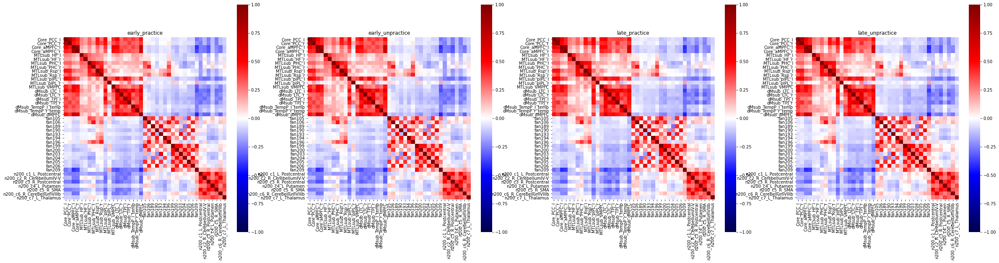

In [14]:
## divide by a number of subjects to obtain the average value
for stage in GA.list_stage:
    for roiA in sorted_rois:
        for roiB in sorted_rois:
            corrmats[stage].loc[roiA,roiB] /= len(subjs)

## plot group results
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(40, 10))
for i, stage in enumerate(GA.list_stage):
    ax = sns.heatmap(corrmats[stage]
                     , square=True, cmap='seismic', cbar=True
    #                  , robust=True
                     , vmin=-1., vmax=1.
                     , xticklabels=sorted_rois, yticklabels=sorted_rois, ax=axs[i])
    ax.set_title('%s'%stage)        

In [15]:
fig.savefig(fname=join(GA.dir_git,'GA/images/%s.group_connectivity_matrices.MO.png'%GA.today))

---

### Previous works

In [15]:
X = res
Y = GA.del_RewardRate

- replication of diagonal 2.

Text(0.5, 1.0, 'r=-0.5594 (p=0.001)')

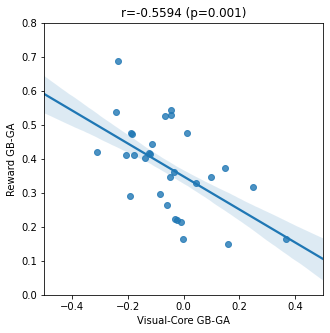

In [15]:
# fig = plt.figure(figsize=(5, 5))
# plt.xlim(-0.5, 0.5)
# plt.ylim(-0., 0.8)
# sns.regplot(x=X, y=Y, ci=GA.sig1*100, truncate=False)
# plt.ylabel('Reward GB-GA')
# plt.xlabel('Visual-Core GB-GA')
# plt.title('r=%.4f (p=%.3f)' % (*scipy.stats.pearsonr(x=X, y=Y),))

In [16]:
# ## Lower-Tailed t-Test
# scipy.stats.ttest_1samp(X, popmean=0, alternative='less')

Ttest_1sampResult(statistic=-1.9650511664948784, pvalue=0.029526146162293616)

- replication of diagonal 1.

Text(0.5, 1.0, 'r=-0.5493 (p=0.002)')

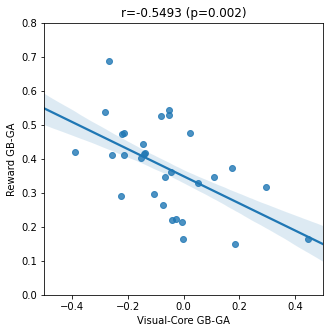

In [9]:
fig = plt.figure(figsize=(5, 5))
plt.xlim(-0.5, 0.5)
plt.ylim(-0., 0.8)
sns.regplot(x=X, y=Y, ci=GA.sig1*100, truncate=False)
plt.ylabel('Reward GB-GA')
plt.xlabel('Visual-Core GB-GA')
plt.title('r=%.4f (p=%.3f)' % (*scipy.stats.pearsonr(x=X, y=Y),))

In [10]:
## Lower-Tailed t-Test
scipy.stats.ttest_1samp(X, popmean=0, alternative='less')

Ttest_1sampResult(statistic=-1.952815303503796, pvalue=0.030276459976303245)

In [11]:
scipy.stats.spearmanr(X,Y)

SpearmanrResult(correlation=-0.5692992213570635, pvalue=0.0010258884981883543)

In [12]:
scipy.stats.wilcoxon(X)

WilcoxonResult(statistic=122.0, pvalue=0.023038144695472357)

- replication of diagonal 0.

Text(0.5, 1.0, 'r=-0.5272 (p=0.003)')

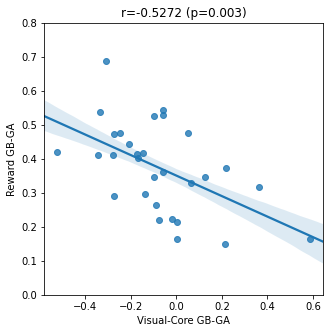

In [12]:
# fig = plt.figure(figsize=(5, 5))
# # plt.xlim(-0.5, 0.5)
# plt.ylim(-0., 0.8)
# sns.regplot(x=X, y=Y, ci=GA.sig1*100, truncate=False)
# plt.ylabel('Reward GB-GA')
# plt.xlabel('Visual-Core GB-GA')
# plt.title('r=%.4f (p=%.3f)' % (*scipy.stats.pearsonr(x=X, y=Y),))

In [11]:
# ## Lower-Tailed t-Test
# scipy.stats.ttest_1samp(X, popmean=0, alternative='less')

Ttest_1sampResult(statistic=-1.8848507537598362, pvalue=0.034753651181442746)

### Partial Correlation by training_day

In [19]:
with open(join(GA.dir_behav,'training_day_n30.1D'),'r') as fr:
    Z = np.genfromtxt(fr, delimiter='\n')

In [26]:
Z_unit = Z/np.linalg.norm(Z)

In [27]:
X_ortho = X - np.matmul(np.outer(Z_unit,Z_unit),X)
Y_ortho = Y - np.matmul(np.outer(Z_unit,Z_unit),Y)

In [ ]:
## regress global activity out

Text(0.5, 1.0, 'r=-0.4123 (p=0.024)')

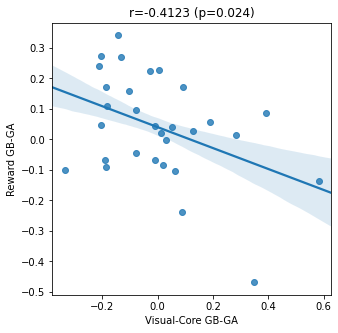

In [17]:
## 1st-order partial of the replication 0.5
X=X_ortho
Y=Y_ortho

fig = plt.figure(figsize=(5, 5))
sns.regplot(x=X, y=Y, ci=GA.sig1*100, truncate=False)
plt.ylabel('Reward GB-GA')
plt.xlabel('Visual-Core GB-GA')
plt.title('r=%.4f (p=%.3f)' % (*scipy.stats.pearsonr(x=X, y=Y),))